In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib as mpl
mpl.rcParams["font.family"] = "Times New Roman"
mpl.rcParams["font.sans-serif"] = "Times New Roman"
mpl.rcParams["font.size"] = 14
from scipy import stats
import random
import warnings
warnings.filterwarnings("ignore")
import os
os.environ["OMP_NUM_THREADS"] = "1" 
from scipy.stats import pearsonr
from ema_workbench.analysis import dimensional_stacking
from ema_workbench.analysis import feature_scoring
viridis_colors=['#440154FF', '#414487FF', '#22A884FF', '#7AD151FF', '#FDE725FF']
from sklearn.linear_model import LinearRegression
from textwrap import wrap

random_seed=111

c:\Users\YarenAslan\OneDrive - Systems Navigator\Desktop\My Files\Graduation Project\Python\Repo\.conda\lib\site-packages\ema_workbench\analysis\prim.py:30: ImportWarning: altair based interactive inspection not available
  warnings.warn(("altair based interactive " "inspection not available"), ImportWarning)


In [2]:
def same_dist_hypothesis(x,y, x_Name="first array", y_Name="second array", to_be_printed="both", p_check=0.05):
    """
    This function plots the 
    
    Arguments
    ---------
    x             : array like
                    First array
                    
    y             : array like
                    Second array

    p_check       : float
                    p-Value used for check
    
    x_Name        : string
                    Name of the x array, used for printing
    
    y_Name        : string
                    Name of the x array, used for printing

    to_be_printed : "both", "reject", "fail_to_reject"
                    Print the result in cases

    Returns
    -------
    result        : boolean
                    Whether we fail to reject the hypothesis (True if we fail to reject, False if we reject)
                            
    """

    if len(x) > 0 and len(y) > 0:
        _, p_value_ks= stats.kstest(x, y)
        _, p_value_levene= stats.levene(x, y)
        if(p_value_ks< p_check or p_value_levene< p_check):
            if to_be_printed=="both" or to_be_printed=="reject":
                print('Reject the hypothesis that', x_Name, 'and', y_Name, 'follow the same distribution (', str(p_value_ks), '&', str(p_value_levene), ')')
            return False
        else:
            if to_be_printed=="both" or to_be_printed=="fail_to_reject":
                print('Fail to reject the hypothesis that', x_Name, 'and', y_Name, 'follow the same distribution (', str(p_value_ks), '&', str(p_value_levene), ')')
                return True
    else:
        print('Test can not be conducted for', x_Name, 'and', y_Name,' because one of the arrays is empty')
        return True


In [3]:
def formalize_regime_name(regime_name):
    if regime_name == 'NoRegime':
        return 'No Regime'
    else:
        string_split = regime_name.split('_')
        formal_regime_name = string_split[0] + '% and ' + string_split[1] + '%, with ' + string_split[2] + ' minutes'
        return formal_regime_name

In [4]:
locking_regime_markers = {
    'NoRegime' : 'o',
    '40_80_10' : 'D',
    '40_80_20' : 'P'
}

locking_regime_palette = {
    'NoRegime' : viridis_colors[0],
    '40_80_10' : viridis_colors[2],
    '40_80_20' : viridis_colors[3],
}
formal_fleetmix = {
    'Baseline': 'Baseline fleet mix',
    'IMA_Driven': 'IMA-driven fleet mix'
}

# Main experiments

In [5]:

factor_dict = {
    'Fleet mix': ('Baseline', 'IMA_Driven'),
    'Locking regime': ('NoRegime', '40_80_10', '40_80_20'),
    'FlutteringProbability': (0.00, 0.015, 0.03),
    'MTTR': (0.5, 2, 3.5),
    'SlowDownEffect': (0, 1/6, 2/6),
    'MeanSlowDownCounter': (2240, 1120, 560),
    'PeriodicInspection': (7, 14, 28)
}

In [6]:
def read_and_merged(merged_df, base_path, file_name, xlsx_name, columns_of_interest, aggregate_with = "mean"):
    file_path = base_path + file_name + '/' + xlsx_name + '.xlsx'
    datafile =  pd.read_excel(file_path)
    if aggregate_with=="mean":
        datafile = datafile.groupby("Replication Id")[columns_of_interest].mean().reset_index()
    elif aggregate_with=="sum":
        datafile = datafile.groupby("Replication Id")[columns_of_interest].sum().reset_index()
    merged_df = pd.merge(merged_df, datafile, on=['Replication Id'], how='right')
    return merged_df

In [8]:
merged_dfs = []
run_length = 28 #days
no_chambers = 3
periodic_duration = 2 #hours
global_set_counter = 0

base_path = "data/Experiments/MainExperiments/"

# for base_path in ["Data/Experiments/MainExperiments/", "Data/Experiments/Screening_Extreme/"]:
for i, fleet_mix in enumerate(factor_dict['Fleet mix']):
    # for chamber_prio in factor_dict['Chamber priority']:
    for j, regime in enumerate(factor_dict['Locking regime']):
        for batch in ['/batch1', '/batch2']:
            file_name = fleet_mix + '_' + regime + batch
            input_file_path = base_path + file_name + '/Scenario Parameters.xlsx'
            input_df =  pd.read_excel(input_file_path, index_col=0)
            no_set_per_file = len(input_df)
            input_df['FleetMix'] = fleet_mix
            input_df['LockingRegime'] = regime

            kpi_file_path = base_path + file_name + '/KPI Locks Summary.xlsx'
            kpi_df =  pd.read_excel(kpi_file_path, index_col=0)
            kpi_df['SetNo'] = 1 + (kpi_df.index -1) % no_set_per_file

            # Adding Emission calculation to kpi_df
            file_path = base_path + file_name + '/KPI Emissions Locks.xlsx'
            datafile =  pd.read_excel(file_path)
            datafile = datafile[datafile["Emission substance"]== "CO2"].loc[:,["Replication Id", "Emissions slowsteaming (kg/day)"]]
            kpi_df = pd.merge(kpi_df, datafile, on=['Replication Id'], how='right')

            # Merging these two dataframes
            merged_df = pd.merge(input_df, kpi_df, on=['SetNo'], how='right')

            # Adding availability calculation to merged_df
            columns_of_interest = ["Planned unavailability", "Unplanned unavailability", "Availability"]
            merged_df = read_and_merged(merged_df, base_path, file_name, 'Log Lock Chambers Daily Availability', columns_of_interest)

            # Adding speed to merged_df
            merged_df = read_and_merged(merged_df, base_path, file_name, 'Log Lock Chambers Daily Speed', ['Percentage speed (hours)'])
            
            # Adding occupancy to merged_df
            columns_of_interest = ["Area served (%)", "DWT served (minutes)"]
            merged_df = read_and_merged(merged_df, base_path, file_name, 'Log Lock Chambers Daily Occupancy', columns_of_interest, "sum")

            # Renaming columns
            merged_df = merged_df.rename(columns={
                "Area served (%)":"Area served (m2)", 
                "DWT served (minutes)":"DWT served (tonne)",
                "Availability": "Availability (%)",
                "Percentage speed (hours)": "Speed (%)",
                "Avg Occupancy (%)": "Occupancy (%)",
                "MeanSlowDownCounter": "MeanSlowdownThreshold"
                })
            merged_df['Avg DWT per leveling (tonne)'] = merged_df['DWT served (tonne)'] / merged_df['Amount of levelings']

            # Adding OEE calculation
            merged_df['Service-based OEE Average'] = merged_df['Availability (%)'] * merged_df['Speed (%)'] * merged_df['Service Level (%)'] / 1e4
            merged_df['Efficiency-based OEE Average'] = merged_df['Availability (%)'] * merged_df['Speed (%)'] * merged_df['Occupancy (%)'] / 1e4
            merged_df['Baseline OEE Average'] = merged_df['Availability (%)'] * merged_df['Speed (%)'] / 1e2

            merged_df['Set_ReplicationId'] = 1 + (merged_df['Replication Id'] -1) // no_set_per_file
            merged_df['GlobalSetNo'] = merged_df['SetNo'] + global_set_counter
            global_set_counter = global_set_counter + no_set_per_file
            merged_dfs.append(merged_df)

experiments = pd.concat(merged_dfs)
# del(merged_dfs)
experiments.describe()

,SetNo,TrafficRange,FleetIntensity,FlutteringProbability,MTTR,SlowDownEffect,MeanSlowdownThreshold,PeriodicInspection,InspectionStart,InspectionDuration,...,Availability (%),Speed (%),Area served (m2),DWT served (tonne),Avg DWT per leveling (tonne),Service-based OEE Average,Efficiency-based OEE Average,Baseline OEE Average,Set_ReplicationId,GlobalSetNo
count,2700.000000,2700.0,2700.0,2700.000000,2700.000000,2700.000000,2700.000000,2700.000000,2700.0,2700.0,...,2700.000000,2700.000000,2.700000e+03,2.700000e+03,2700.000000,2700.000000,2700.000000,2700.000000,2700.000000,2700.000000
mean,12.200000,1.5,0.0,0.012000,2.000000,0.133333,1456.000000,16.333333,8.0,2.0,...,99.145301,98.346932,9.189509e+06,2.145690e+07,7031.594214,70.046520,41.588738,97.507724,5.500000,135.500000
std,7.214287,0.0,0.0,0.011227,1.224972,0.124745,672.124479,8.732151,0.0,0.0,...,0.490232,2.279206,1.137325e+06,2.658797e+06,757.732447,9.019612,4.131536,2.365858,2.872813,77.956189
min,1.000000,1.5,0.0,0.000000,0.500000,0.000000,560.000000,7.000000,8.0,2.0,...,96.240369,85.544916,8.026882e+06,1.862926e+07,5841.075288,48.048238,32.900318,84.470759,1.000000,1.000000
25%,6.000000,1.5,0.0,0.000000,0.500000,0.000000,1120.000000,7.000000,8.0,2.0,...,98.809524,97.650951,8.052652e+06,1.879844e+07,6289.382588,62.039058,37.499746,96.907342,3.000000,68.000000
50%,12.000000,1.5,0.0,0.015000,2.000000,0.166667,1120.000000,14.000000,8.0,2.0,...,99.334431,99.398968,9.192459e+06,2.146553e+07,7066.377813,69.345379,41.339495,98.303603,5.500000,135.500000
75%,17.000000,1.5,0.0,0.015000,3.500000,0.166667,2240.000000,28.000000,8.0,2.0,...,99.546266,99.671107,1.032673e+07,2.411345e+07,7784.993918,77.821543,45.613885,98.961896,8.000000,203.000000
max,27.000000,1.5,0.0,0.030000,3.500000,0.333333,2240.000000,28.000000,8.0,2.0,...,99.702381,100.090868,1.036553e+07,2.430976e+07,8399.851798,86.823812,48.586329,99.792316,10.000000,270.000000


In [9]:
experiments['LockCondition'] = experiments.apply(lambda x: 
                                           '(1) Ideal' if ((x['FlutteringProbability']==0) and (x['SlowDownEffect']==0))
                                           else('(2) Fluttering only' if ((x['FlutteringProbability']==0.015) and (x['SlowDownEffect']==0))
                                                else '(3) Slowdown only' if ((x['FlutteringProbability']==0) and (x['SlowDownEffect']!=0))
                                                else '(4) Regular deterioration' if (x['FlutteringProbability']==0.015) else 
                                                '(5) Rapid deterioration' if (x['FlutteringProbability']==0.03) else 'faulty'), axis=1)
experiments = experiments.sort_values(['FleetMix', 'LockCondition', 'LockingRegime'])

In [10]:
experiments['Avg lockage time (minutes)'] = 60*experiments['Total Leveling Time (hours)']/experiments['Amount of ships']
experiments['Unavailability (hours)'] = experiments['Planned unavailability'] + experiments['Unplanned unavailability']

experiments.rename(columns={
    'Amount of ships':'Number of ships',
    'Amount of levelings' : 'Number of levelings',
    'Amount of empty levelings (%)' : 'Number of empty levelings (%)',
    'Emissions slowsteaming (kg/day)' : 'CO2 emissions (kg/day)',
    }, inplace=True)
desired_column_order = ['GlobalSetNo', 'Set_ReplicationId', 
       'FleetMix', 'LockCondition', 'FlutteringProbability', 'SlowDownEffect', 'MeanSlowdownThreshold', 
       'LockingRegime', 'MTTR', 'PeriodicInspection', 
       'Lock', 'Number of ships', 'Number of levelings',
       'Number of empty levelings (%)',
       'Max number of ships waiting', 
       'Avg passage time (minutes)', 'Avg lockage time (minutes)', 'Avg waiting time (minutes)', 
       'Avg ships per leveling', 'Avg ships per filled leveling',
       'CO2 emissions (kg/day)', 'Area served (m2)', 'DWT served (tonne)', 'Avg DWT per leveling (tonne)',
       'Planned unavailability', 'Unplanned unavailability', 'Unavailability (hours)',
       'Availability (%)', 'Speed (%)', 'Service Level (%)', 'Occupancy (%)',
       'Baseline OEE Average', 'Service-based OEE Average', 'Efficiency-based OEE Average']
experiments = experiments.reindex(columns=desired_column_order)
experiments.head()

,GlobalSetNo,Set_ReplicationId,FleetMix,LockCondition,FlutteringProbability,SlowDownEffect,MeanSlowdownThreshold,LockingRegime,MTTR,PeriodicInspection,...,Planned unavailability,Unplanned unavailability,Unavailability (hours),Availability (%),Speed (%),Service Level (%),Occupancy (%),Baseline OEE Average,Service-based OEE Average,Efficiency-based OEE Average
0,46,1,Baseline,(1) Ideal,0.0,0.0,2240,40_80_10,0.5,7,...,8.0,0.0,8.0,98.809524,100.081062,79.630438,36.856769,98.889621,78.746238,36.447519
1,47,1,Baseline,(1) Ideal,0.0,0.0,2240,40_80_10,0.5,14,...,4.0,0.0,4.0,99.404762,100.081084,80.180311,37.166681,99.485363,79.767674,36.975407
2,48,1,Baseline,(1) Ideal,0.0,0.0,2240,40_80_10,0.5,28,...,2.0,0.0,2.0,99.702381,100.079965,81.800989,36.583189,99.782108,81.622751,36.503477
3,49,1,Baseline,(1) Ideal,0.0,0.0,2240,40_80_10,2.0,7,...,8.0,0.0,8.0,98.809524,100.080073,78.490401,36.972192,98.888644,77.618093,36.561299
4,50,1,Baseline,(1) Ideal,0.0,0.0,2240,40_80_10,2.0,14,...,4.0,0.0,4.0,99.404762,100.081159,80.988372,37.391557,99.485438,80.571637,37.199154


## Setting global xlims and ylims for all variables

In [11]:
cols_KPIs = ['CO2 emissions (kg/day)', 'Avg lockage time (minutes)', 'Avg waiting time (minutes)', 'Number of levelings', 'Unavailability (hours)']
# To discuss in relation with 'Avg waiting time (minutes)' : 'Max number of ships waiting', 'Service Level (%)'
cols_waiting = ['Avg waiting time (minutes)', 'Max number of ships waiting', 'Service Level (%)']
# To discuss in relation with 'Number of levelings' : 'Number of empty levelings (%)'
cols_leveling = ['Number of levelings', 'Number of empty levelings (%)']
## OEE potential
cols_OEEs = ['Baseline OEE Average', 'Service-based OEE Average', 'Efficiency-based OEE Average']

In [12]:
lim_dict = {}
padding = 0.05
for col in experiments.columns:
    if pd.Series(col).isin(cols_OEEs)[0]:
        lim_dict[col] = [
            experiments[col].min()*(1-padding),
            100
        ]
    elif experiments[col].dtype == 'float64' or experiments[col].dtype == 'int64':
        lim_dict[col] = [
            experiments[col].min()*(1-padding),
            experiments[col].max()*(1+padding)
        ]

In [13]:
lim_dict

{'GlobalSetNo': [0.95, 283.5],
 'Set_ReplicationId': [0.95, 10.5],
 'FlutteringProbability': [0.0, 0.0315],
 'SlowDownEffect': [0.0, 0.34999999965],
 'MeanSlowdownThreshold': [532.0, 2352.0],
 'MTTR': [0.475, 3.6750000000000003],
 'PeriodicInspection': [6.6499999999999995, 29.400000000000002],
 'Number of ships': [6518.9, 9258.9],
 'Number of levelings': [2570.7, 3531.15],
 'Number of empty levelings (%)': [4.13900414935, 11.164742916600002],
 'Max number of ships waiting': [9.5, 116.55000000000001],
 'Avg passage time (minutes)': [32.388436354999996, 63.1122556953],
 'Avg lockage time (minutes)': [17.727038912939364, 24.035704420631813],
 'Avg waiting time (minutes)': [14.25189565755, 41.12087435505],
 'Avg ships per leveling': [2.03271624165, 3.1964730294000003],
 'Avg ships per filled leveling': [2.2183870964, 3.4020618555000004],
 'CO2 emissions (kg/day)': [20356.77039298325, 51300.855816181655],
 'Area served (m2)': [7625537.567420742, 10883807.224428747],
 'DWT served (tonne)': [

In [14]:
cols_outcomes = list(experiments.columns[11:])
cols_experiments = list(experiments.columns[[2,3,7,8,9]])

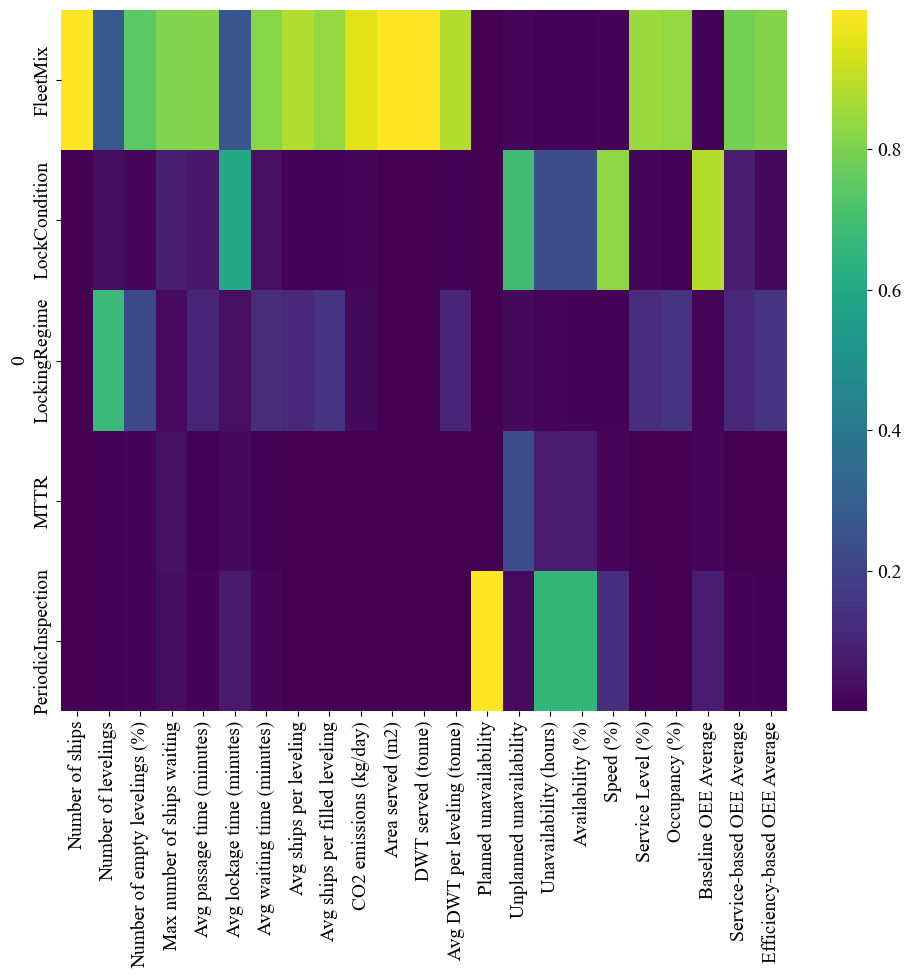

In [15]:
x = experiments.loc[:, cols_experiments] 
y = experiments.loc[:, cols_outcomes] # experiments.loc[:, cols_KPIs] 

np.random.seed(random_seed)
random.seed(random_seed)


plt.figure(figsize=(10, 10))
fs = feature_scoring.get_feature_scores_all(x, y)
sns.heatmap(fs, cmap="viridis", fmt='.1f', annot=False)
plt.tight_layout()
plt.savefig('output/figs/output_analysis/main_experiment/feature_scoring.pdf')

plt.show()

In [16]:
fleet_mix_dict = {
    'Baseline': 'Baseline fleet mix',
    'IMA_Driven': 'IMA-driven fleet mix'
}

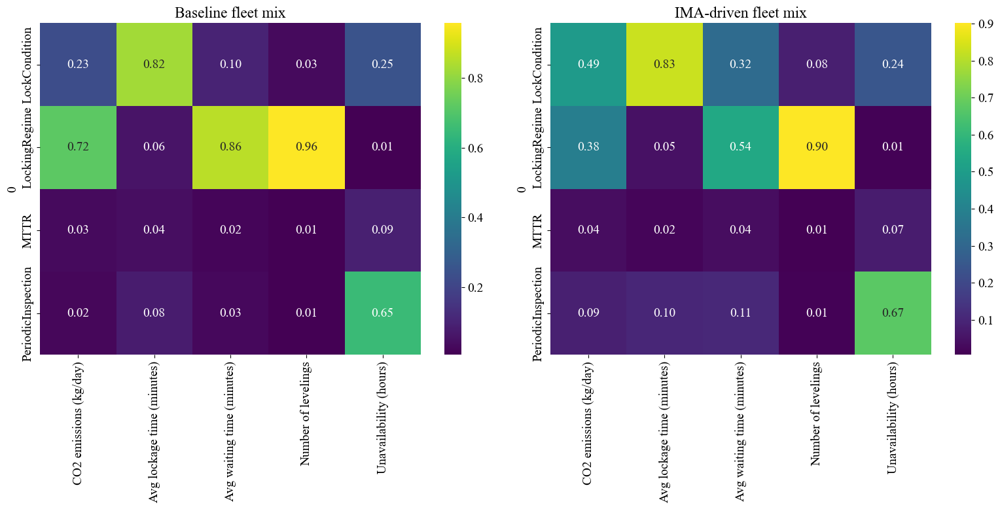

In [17]:
cols_experiments_without_scenario = cols_experiments.copy()
cols_experiments_without_scenario.remove('FleetMix')

fig, axs = plt.subplots(1, 2, figsize=(16, 8))

np.random.seed(random_seed)
random.seed(random_seed)

fs_per_mix = {}

for i, fleet_mix in enumerate(list(experiments.FleetMix.unique())):
    x = experiments.loc[experiments['FleetMix']==fleet_mix, cols_experiments_without_scenario] 
    y = experiments.loc[experiments['FleetMix']==fleet_mix, cols_KPIs] 
    fs_per_mix[fleet_mix] = feature_scoring.get_feature_scores_all(x, y)
    sns.heatmap(fs_per_mix[fleet_mix], cmap="viridis", fmt='.2f', annot=True, ax=axs[i])
    axs[i].set_title(fleet_mix_dict[fleet_mix])

plt.tight_layout()
plt.savefig('output/figs/output_analysis/main_experiment/All/feature_scoring_both_fleet_mixes.pdf')
plt.show()

Baseline


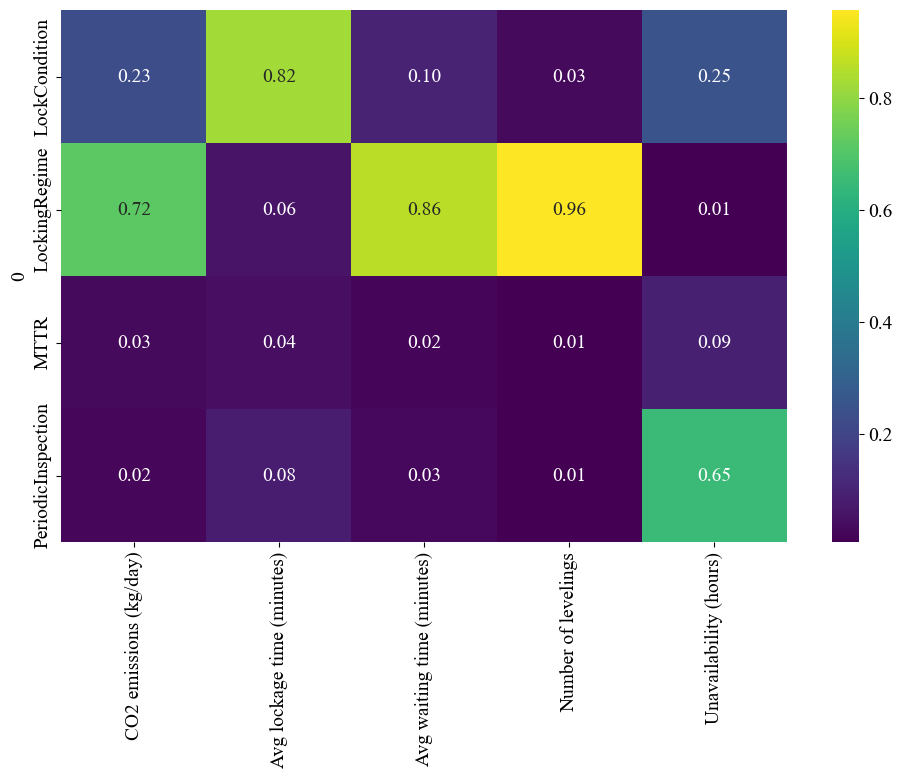

IMA_Driven


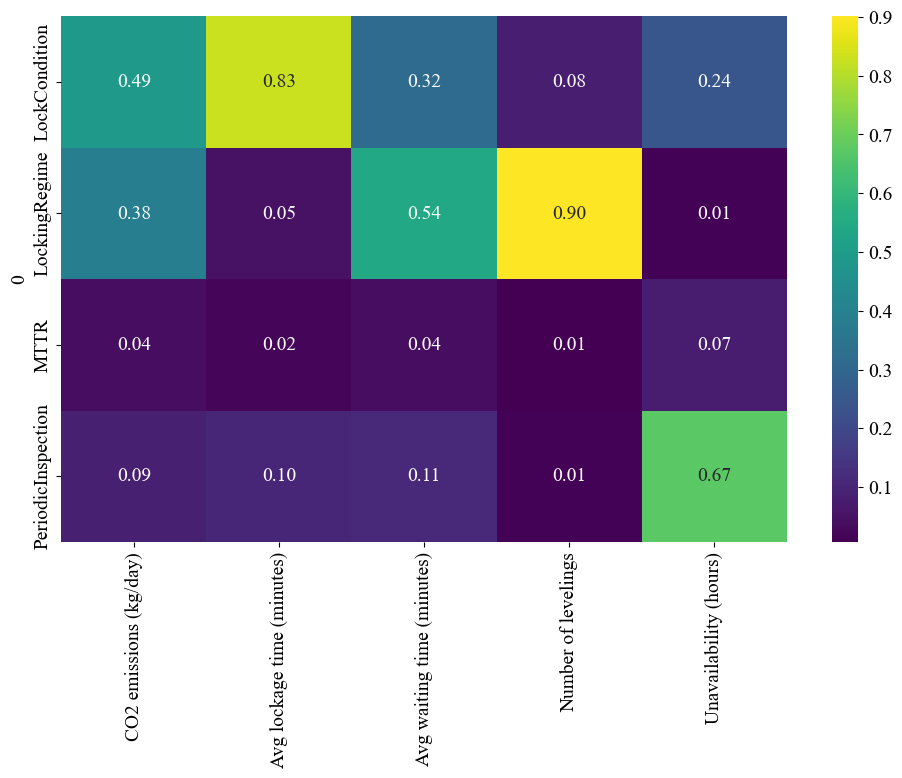

In [18]:
np.random.seed(random_seed)
random.seed(random_seed)


for i, fleet_mix in enumerate(list(experiments.FleetMix.unique())):
    x = experiments.loc[experiments['FleetMix']==fleet_mix, cols_experiments_without_scenario] 
    y = experiments.loc[experiments['FleetMix']==fleet_mix, cols_KPIs] 
    plt.figure(figsize=(10, 8))
    print(fleet_mix)
    sns.heatmap(fs_per_mix[fleet_mix], cmap="viridis", fmt='.2f', annot=True)
    plt.tight_layout()
    plt.savefig('output/figs/output_analysis/main_experiment/' + fleet_mix + '/feature_scoring.pdf')
    plt.show()

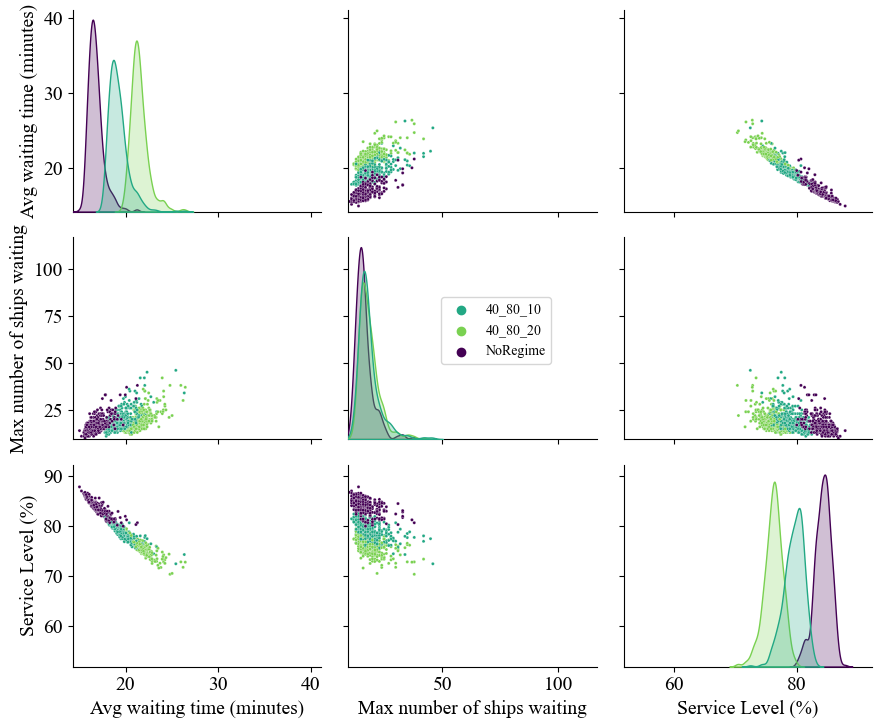

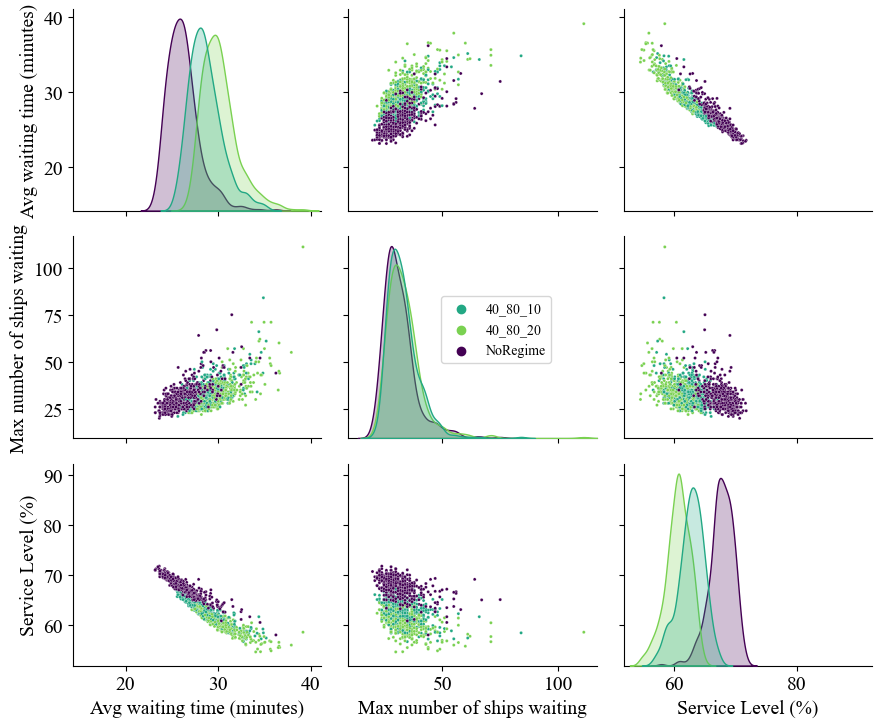

In [19]:
cols_experiments_without_scenario = cols_experiments.copy()
cols_experiments_without_scenario.remove('FleetMix')

np.random.seed(random_seed)
random.seed(random_seed)


for i, fleet_mix in enumerate(list(experiments.FleetMix.unique())):
    g = sns.pairplot(experiments.loc[experiments['FleetMix']==fleet_mix, cols_waiting + ['LockingRegime']], hue="LockingRegime", 
                 plot_kws={"s": 5}, palette= locking_regime_palette)
    # plt.tight_layout()
    handles = g._legend_data.values()
    labels = g._legend_data.keys()
    g._legend.remove()
    g.fig.legend(handles=handles, labels=labels, loc=(0.5, 0.5), ncol=1, fontsize=10)

    for ax in g.axes.flat:
        if ax.get_xlabel() != '':
            ax.set_xlim(lim_dict[ax.get_xlabel()])
        if ax.get_ylabel() != '':
            ax.set_ylim(lim_dict[ax.get_ylabel()])

    plt.tight_layout()
    plt.savefig('output/figs/output_analysis/main_experiment/' + fleet_mix + '/pair_plot_waiting.pdf')
    plt.show()

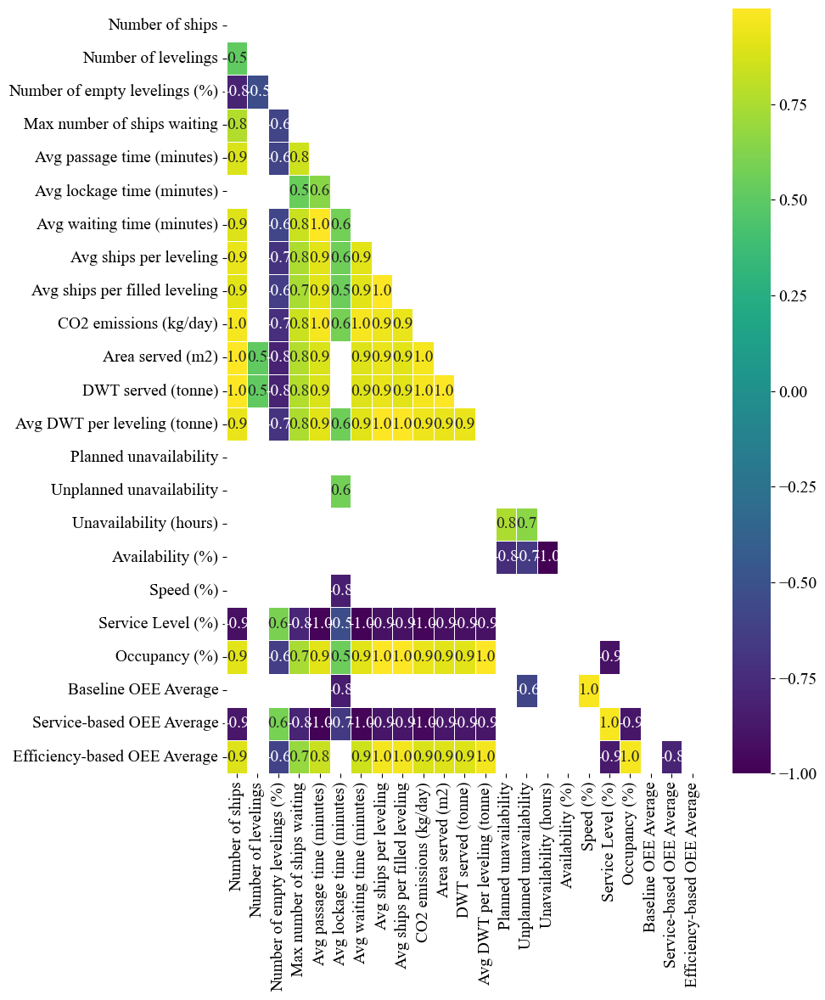

In [20]:
cols_of_interest = cols_outcomes # + cols_experiments[:-3] # last three are categorical

corr_matrix = experiments.loc[:,cols_of_interest].corr()
p_values = pd.DataFrame(index=cols_of_interest, columns=cols_of_interest, dtype=float)

for col1 in cols_of_interest:
    for col2 in cols_of_interest:
        if type(experiments[col1][0])==str or type(experiments[col2][0])==str:
            pass
        else:
            corr, p_value = pearsonr(experiments[col1], experiments[col2])
            p_values.loc[col1, col2] = p_value

# Set the diagonal values to empty strings
# np.fill_diagonal(p_values.values, '')

mask_corr = np.triu(np.ones_like(corr_matrix, dtype=bool)) | np.array(p_values>0.05) | np.array(abs(corr_matrix)<0.5)
corr_matrix = np.ma.masked_array(corr_matrix, mask=mask_corr)

# Plot the correlation matrix with p-values using a heatmap
plt.figure(figsize=(10, 12))
sns.heatmap(corr_matrix, annot=True, cmap='viridis', fmt='.1f', linewidths=0.5, mask=mask_corr,
    xticklabels=cols_of_interest, yticklabels=cols_of_interest)

# Add title and adjust layout
# plt.title('Correlation Plot')
plt.tight_layout()
plt.savefig('output/figs/output_analysis/main_experiment/All/CorrelationPlot.pdf')

# Show the plot
plt.show()


In [21]:
def annotate_lock_regime(ax, df, locking_regime, objectives_set):
    # ax.annotate('Renovation of Gate ' + gate + ' (' + chamber + ' chamber), completed on ' + date,
    loc = (df[df['LockingRegime'] == locking_regime][objectives_set[0]].quantile(0.9),
           df[df['LockingRegime'] == locking_regime][objectives_set[1]].quantile(0.25))
    ax.annotate('\n'.join(wrap(formalize_regime_name(locking_regime), 15)),
            xy=loc, xycoords='data',
            # xytext=(-16, 10), textcoords='offset pixels',
            horizontalalignment='right',
            bbox=dict(boxstyle="round", alpha=0.8, fc="white", ec="gray"),
            verticalalignment='bottom', rotation=0, fontsize=9) # 

In [22]:
def scatterplot_with_regimes(fleet_mix, objectives_set, save_loc=''):

    fig, ax = plt.subplots(figsize=(10, 5))

    x_col, y_col= objectives_set
    color_column= 'LockCondition'
    # size_column='LockingRegime' 
    style_column='LockingRegime'
    sns.scatterplot(data=experiments[experiments['FleetMix']==fleet_mix], x=x_col, y=y_col, hue=color_column, 
                    palette='viridis', style=style_column, markers=locking_regime_markers, ax=ax) # size=size_column, 
    ax.legend(fontsize=10)
    ax.set_xlim(lim_dict[x_col])
    ax.set_ylim(lim_dict[y_col])
    annotate_lock_regime(ax, experiments[experiments['FleetMix']==fleet_mix], 'NoRegime', objectives_set)
    annotate_lock_regime(ax, experiments[experiments['FleetMix']==fleet_mix], '40_80_10', objectives_set)
    annotate_lock_regime(ax, experiments[experiments['FleetMix']==fleet_mix], '40_80_20', objectives_set)

    if save_loc!='':
        plt.tight_layout()
        plt.savefig(save_loc)
        plt.show()


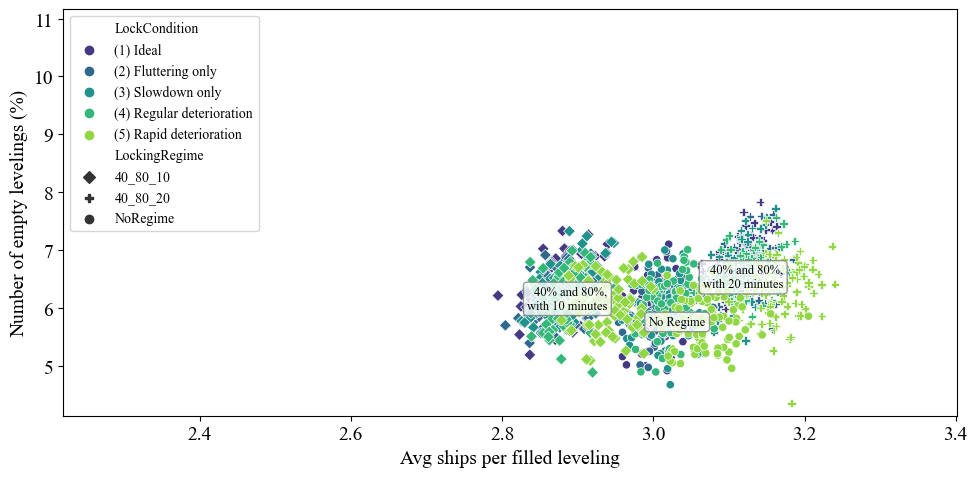

In [23]:
objectives_set = ('Avg ships per filled leveling', 'Number of empty levelings (%)')

# objectives_set = ('Service Level (%)', 'Occupancy (%)')
# objectives_set = ('Service Level (%)', 'Avg waiting time (minutes)')
scatterplot_with_regimes(fleet_mix, objectives_set, 
                         save_loc='output/figs/output_analysis/main_experiment/' + fleet_mix + '/scatter_plot_with_regimes ' + 
                         str(objectives_set).replace('/', '').replace(' ', '') + '.pdf')


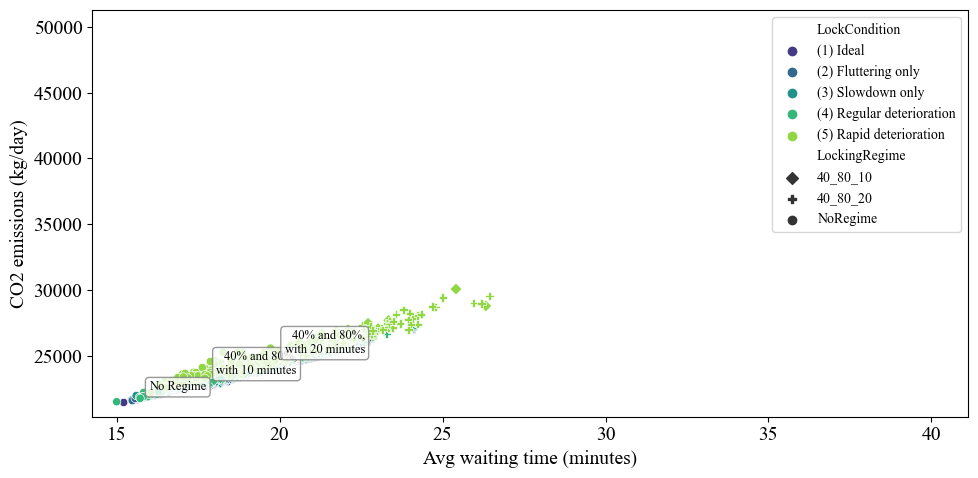

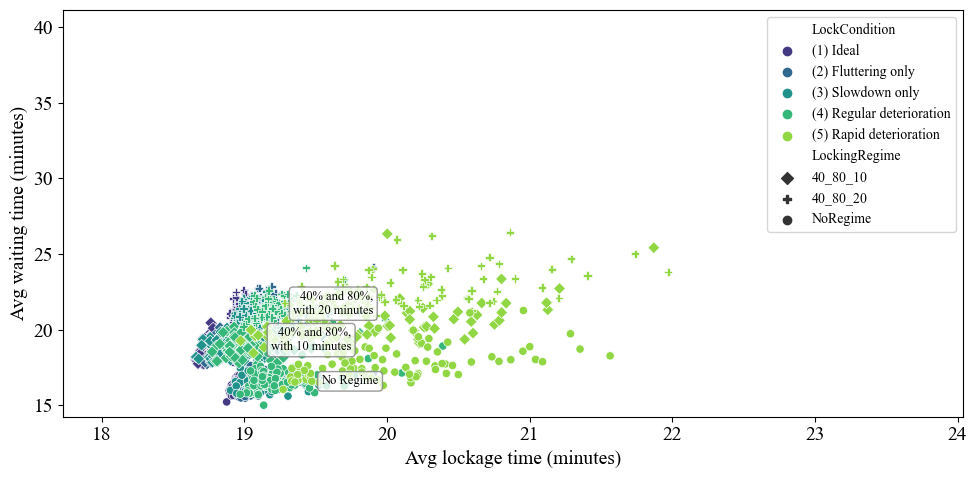

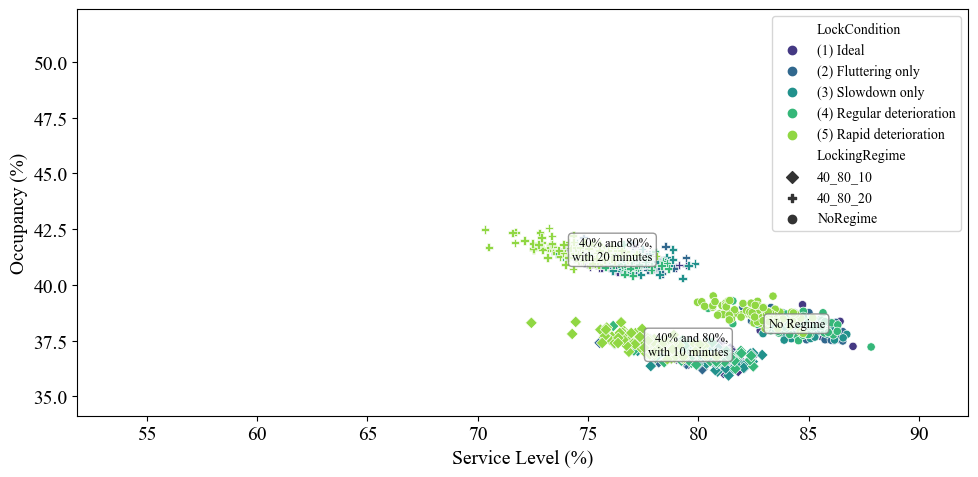

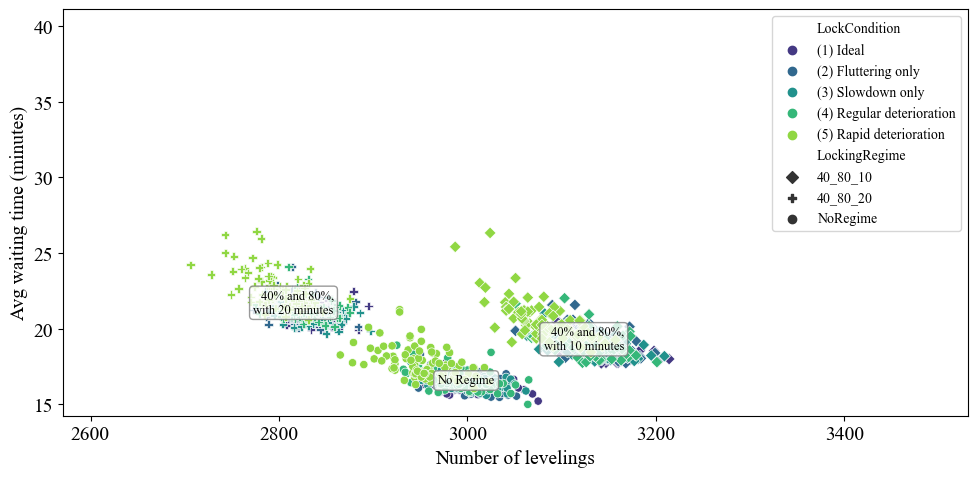

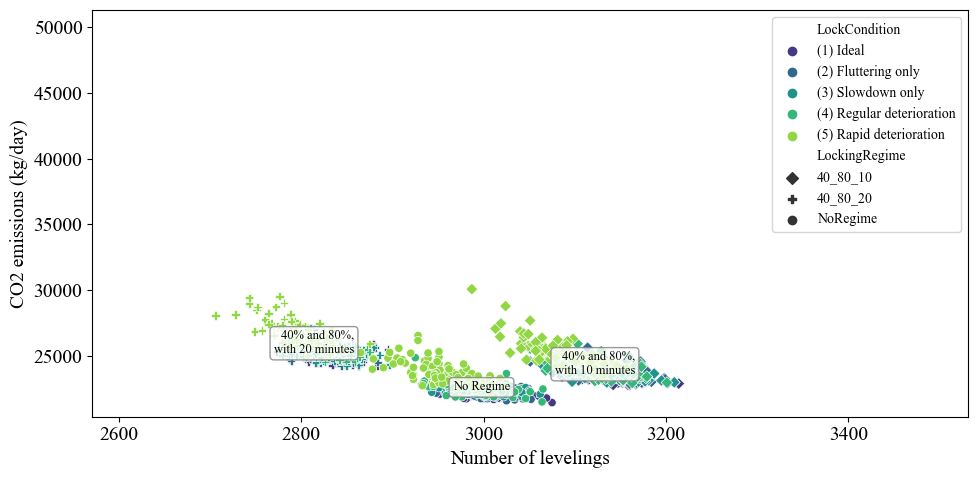

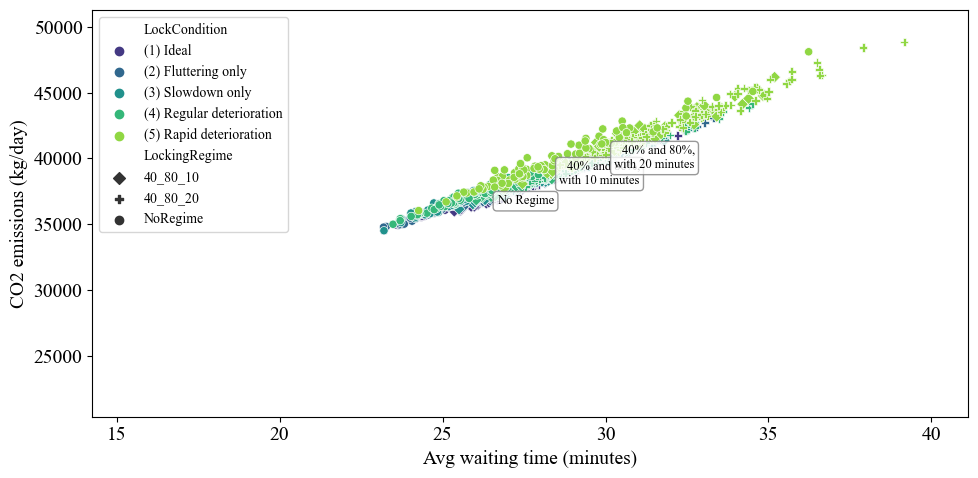

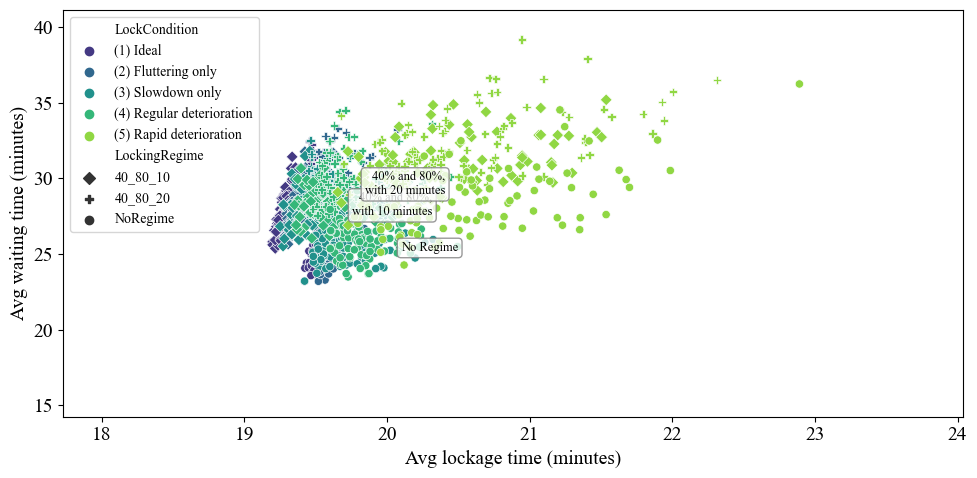

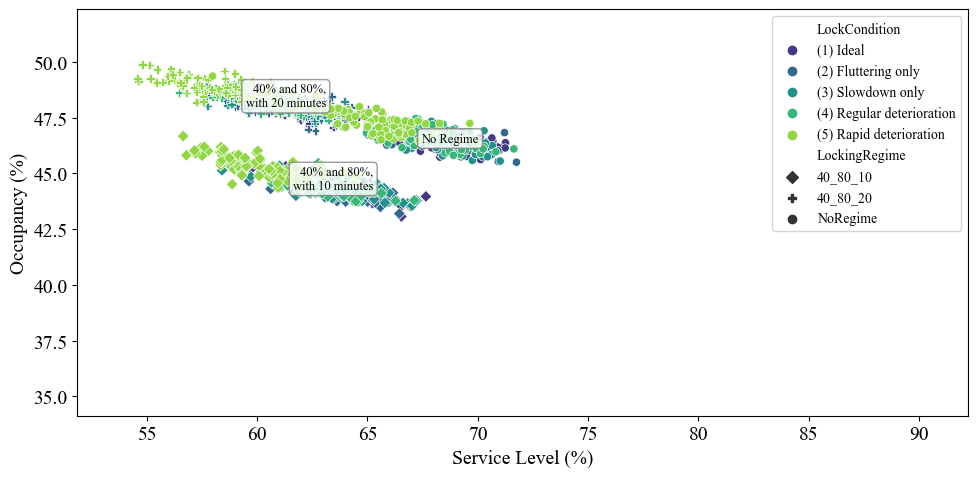

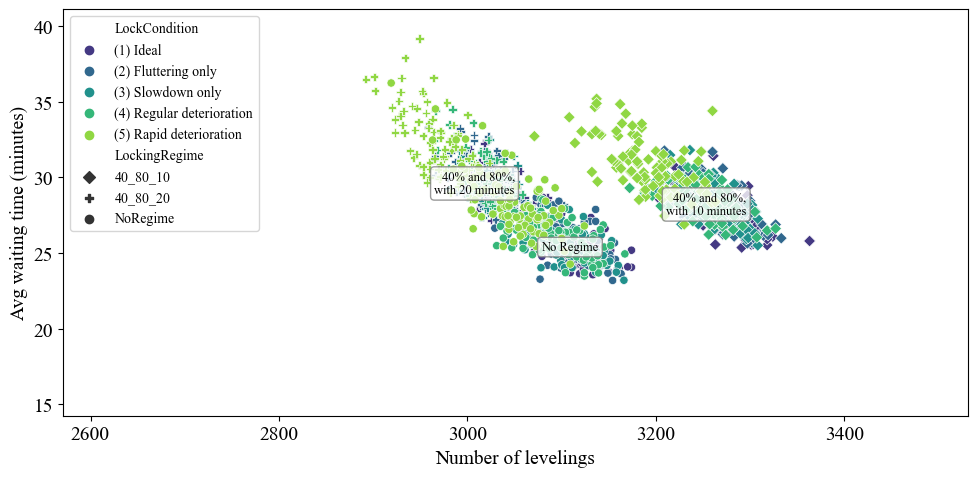

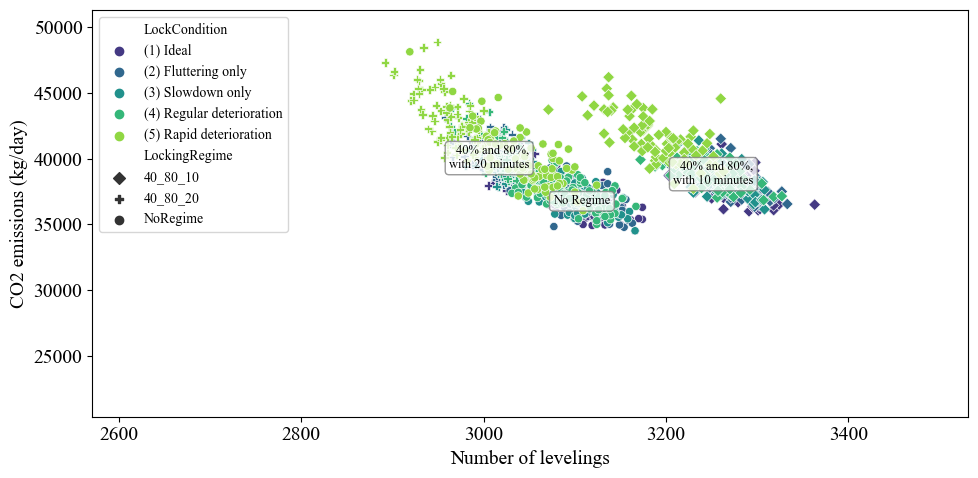

In [24]:
for i, fleet_mix in enumerate(list(experiments.FleetMix.unique())):
    for objectives_set in [('Avg waiting time (minutes)', 'CO2 emissions (kg/day)'),
                           ('Avg lockage time (minutes)', 'Avg waiting time (minutes)'),
                           ('Service Level (%)', 'Occupancy (%)'), 
                           ('Number of levelings', 'Avg waiting time (minutes)'),
                           ('Number of levelings', 'CO2 emissions (kg/day)')]:
        # objectives_set = ('Service Level (%)', 'Occupancy (%)')
        # objectives_set = ('Service Level (%)', 'Avg waiting time (minutes)')
        scatterplot_with_regimes(fleet_mix, objectives_set, 
                                 save_loc='output/figs/output_analysis/main_experiment/' + fleet_mix + '/scatter_plot_with_regimes ' + 
                                 str(objectives_set).replace('/', '').replace(' ', '') + '.pdf')

# plt.ylim(20, 60)
# plt.xlim(40, 100)

In [25]:
def wrap_ax_xlabels(ax):
    ax.set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in ax.get_xticklabels()])

In [27]:
def plot_dimensional_stacking(
        experiments, col_of_interest, 
        quantile_selection = 0.75, direction="greater", 
        save_plots=False, fleet_mix=None,
    ):

    if fleet_mix==None:
        df = experiments
        fs_used = fs
    else:
        df = experiments[experiments['FleetMix']==fleet_mix]
        fs_used = fs_per_mix[fleet_mix]

    cols_experiments_selected = fs_used[col_of_interest].sort_values(ascending=False)[0:4].index

    x = df.loc[:, cols_experiments_selected].reset_index(drop=True).astype(object)
    if direction=="greater":
        y = df[col_of_interest] > df[col_of_interest].quantile(quantile_selection)
    else:
        y = df[col_of_interest] < df[col_of_interest].quantile(quantile_selection)

    plt.figure(figsize=(16, 12))
    dimensional_stacking.create_pivot_plot(x, y, 2, bin_labels=True)

    if save_plots==True:
        plt.tight_layout()
        if fleet_mix==None:
            plt.savefig('output/figs/output_analysis/main_experiment/All/dimensional_stacking/' + col_of_interest.replace('/','').replace(' (%)','') + '.pdf', bbox_inches='tight')
        else:
            plt.savefig('output/figs/output_analysis/main_experiment/' + fleet_mix + '/dimensional_stacking/' + col_of_interest.replace('/','').replace(' (%)','') + '.pdf', 
                        bbox_inches='tight')

    plt.show()

    return cols_experiments_selected

In [28]:
def plot_dimensional_stacking_and_boxplots(experiments, col_of_interest, save_plots=False, plot_one=False, fleet_mix=None):
    cols_experiments_selected = plot_dimensional_stacking(experiments, col_of_interest, save_plots=save_plots, fleet_mix=fleet_mix)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

    if fleet_mix==None:
        df = experiments
    else:
        df = experiments[experiments['FleetMix']==fleet_mix]

    if cols_experiments_selected[0]=='LockingRegime':
        sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[2], order=["NoRegime", "40_80_10", "40_80_20"],
                    data=df, palette=viridis_colors, width=0.5, ax=ax1)
    elif cols_experiments_selected[2]=='LockingRegime':
        sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[2], hue_order=["NoRegime", "40_80_10", "40_80_20"],
                    data=df, palette=viridis_colors, width=0.5, ax=ax1)
    else:
        sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[2],
                    data=df, palette=viridis_colors, width=0.5, ax=ax1)

    # ax1.set_xticklabels(ax1.get_xticklabels(), rotation=10) '\n'.join(wrap(formalize_regime_name(locking_regime), 15)
    ax1.set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in ax1.get_xticklabels()])
    ax1.set_ylim(lim_dict[ax1.get_ylabel()])

    if cols_experiments_selected[1]=='LockingRegime':
        sns.boxplot(y=col_of_interest, x=cols_experiments_selected[1], hue=cols_experiments_selected[3], order=["NoRegime", "40_80_10", "40_80_20"],
                    data=df, palette=viridis_colors, width=0.5, ax=ax2)
    elif cols_experiments_selected[3]=='LockingRegime':
        sns.boxplot(y=col_of_interest, x=cols_experiments_selected[1], hue=cols_experiments_selected[3], hue_order=["NoRegime", "40_80_10", "40_80_20"],
                    data=df, palette=viridis_colors, width=0.5, ax=ax2)
    else:
        sns.boxplot(y=col_of_interest, x=cols_experiments_selected[1], hue=cols_experiments_selected[3],
                    data=df, palette=viridis_colors, width=0.5, ax=ax2)
    ax2.set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in ax2.get_xticklabels()])
    ax2.set_ylim(lim_dict[ax2.get_ylabel()])

    if save_plots==True:
        plt.tight_layout()
        if fleet_mix==None:
            plt.savefig('output/figs/output_analysis/main_experiment/All/boxplots/' + col_of_interest.replace('/','').replace(' (%)','') + '.pdf', bbox_inches='tight')
        else:
            plt.savefig('output/figs/output_analysis/main_experiment/' + fleet_mix + '/boxplots/' + col_of_interest.replace('/','').replace(' (%)','') + '.pdf', 
                        bbox_inches='tight')

    plt.show()

    if plot_one==True:
        fig, ax = plt.subplots(figsize=(8, 8))

        
        if fleet_mix==None:
            df = experiments
        else:
            df = experiments[experiments['FleetMix']==fleet_mix]

        if cols_experiments_selected[0]=='LockingRegime':
            sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[2], order=["NoRegime", "40_80_10", "40_80_20"],
                        data=df, palette=viridis_colors, width=0.5, ax=ax)
        elif cols_experiments_selected[2]=='LockingRegime':
            sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[2], hue_order=["NoRegime", "40_80_10", "40_80_20"],
                        data=df, palette=viridis_colors, width=0.5, ax=ax)
        else:
            sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[2],
                        data=df, palette=viridis_colors, width=0.5, ax=ax)

        # ax1.set_xticklabels(ax1.get_xticklabels(), rotation=10) '\n'.join(wrap(formalize_regime_name(locking_regime), 15)
        ax.set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in ax.get_xticklabels()])
        ax.set_ylim(lim_dict[ax.get_ylabel()])

        plt.tight_layout()
        plt.savefig('output/figs/output_analysis/main_experiment/All/boxplots/OnlyFirstTwo' + col_of_interest.replace('/','').replace(' (%)','') + '.pdf', bbox_inches='tight')
        plt.show()


        if cols_experiments_selected[0]=='LockingRegime':
            sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[1], order=["NoRegime", "40_80_10", "40_80_20"],
                        data=df, palette=viridis_colors, width=0.5, ax=ax)
        elif cols_experiments_selected[1]=='LockingRegime':
            sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[1], hue_order=["NoRegime", "40_80_10", "40_80_20"],
                        data=df, palette=viridis_colors, width=0.5, ax=ax)
        else:
            sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[1],
                        data=df, palette=viridis_colors, width=0.5, ax=ax)

        # sns.boxplot(y=col_of_interest, x=cols_experiments_selected[0], hue=cols_experiments_selected[1], data=df, palette=viridis_colors, width=0.5, ax=ax)
        ax.set_ylim(lim_dict[ax.get_ylabel()])
        ax.set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in ax.get_xticklabels()])

        if save_plots==True:
            plt.tight_layout()
            if fleet_mix==None:
                plt.savefig('output/figs/output_analysis/main_experiment/All/boxplots/One' + col_of_interest.replace('/','').replace(' (%)','') + '.pdf', bbox_inches='tight')
            else:
                plt.savefig('output/figs/output_analysis/main_experiment/' + fleet_mix + '/boxplots/One' + col_of_interest.replace('/','').replace(' (%)','') + '.pdf', 
                            bbox_inches='tight')
        plt.show()


---------------------------------------------------------------------------
CO2 emissions (kg/day)


<Figure size 1600x1200 with 0 Axes>

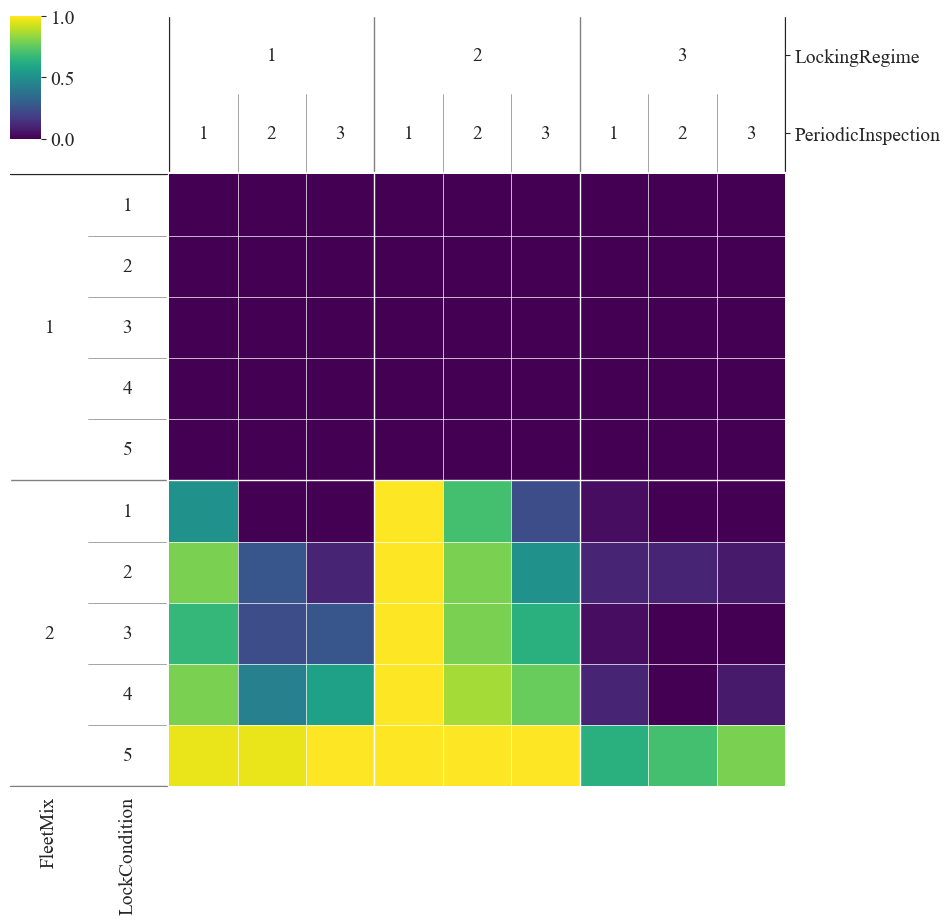

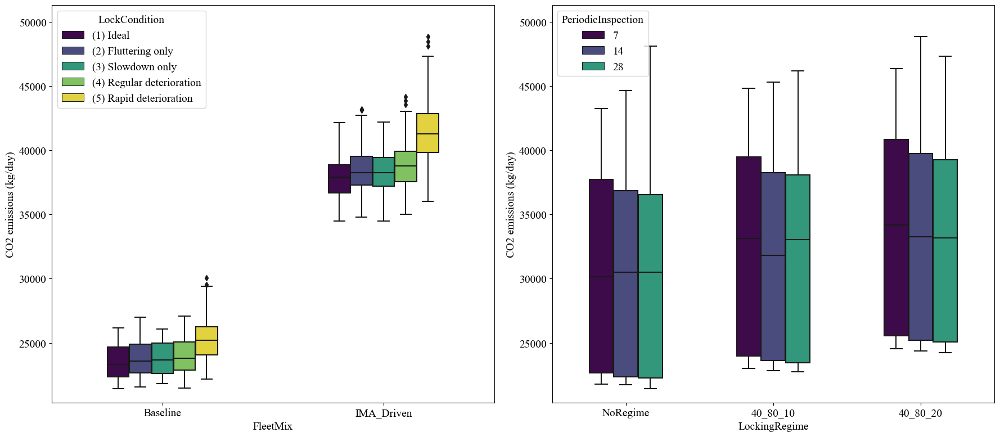

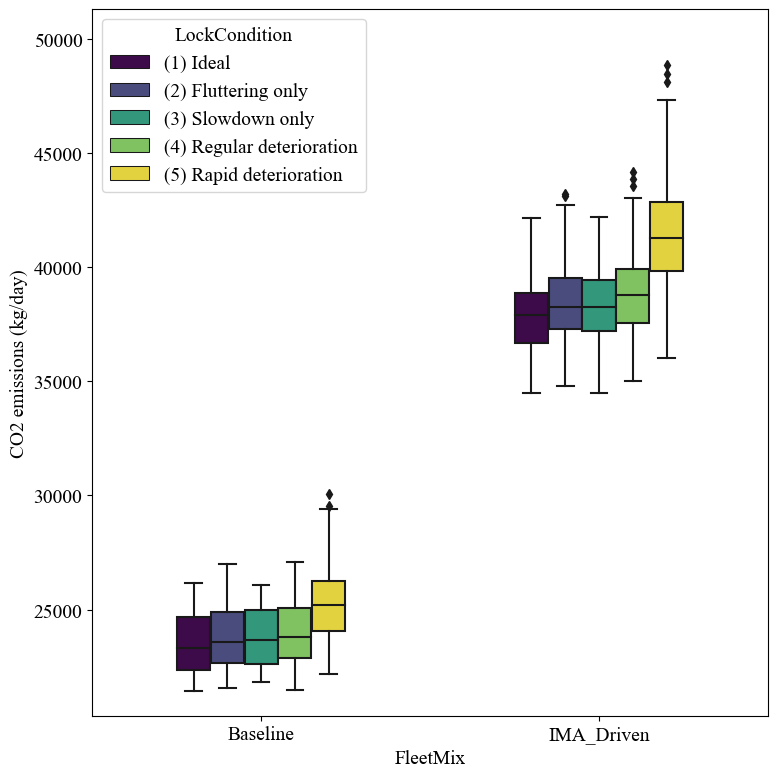

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Avg lockage time (minutes)


<Figure size 1600x1200 with 0 Axes>

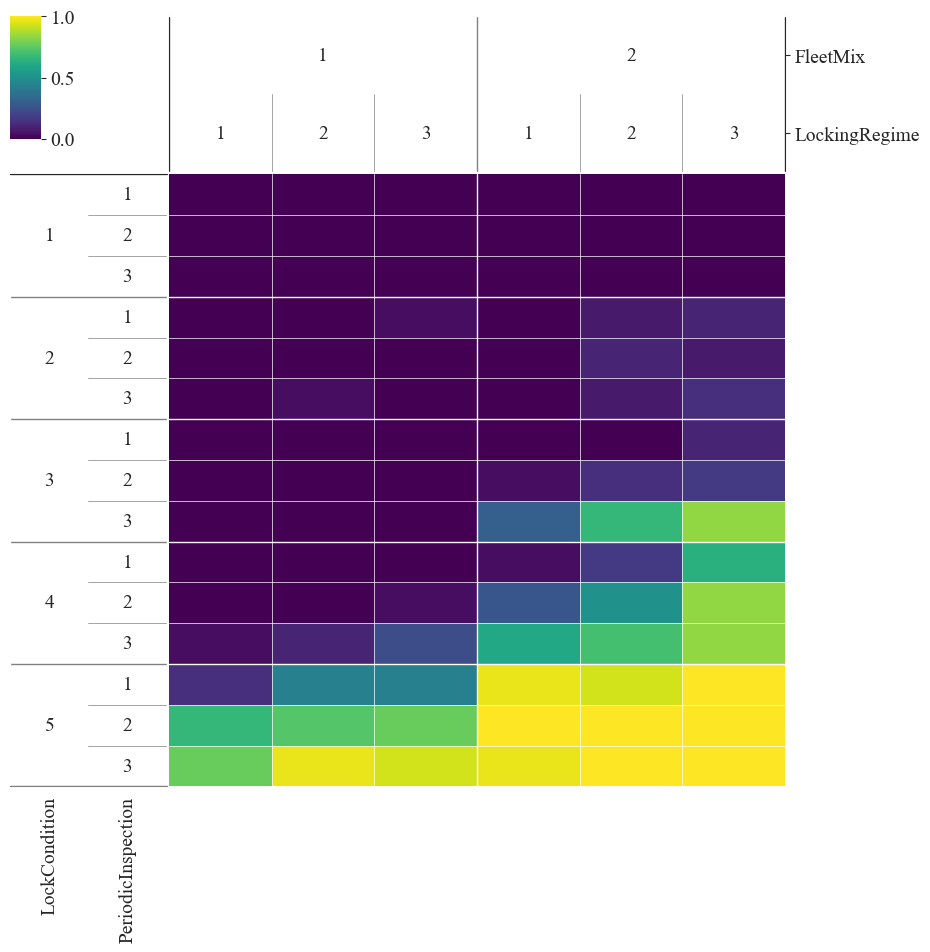

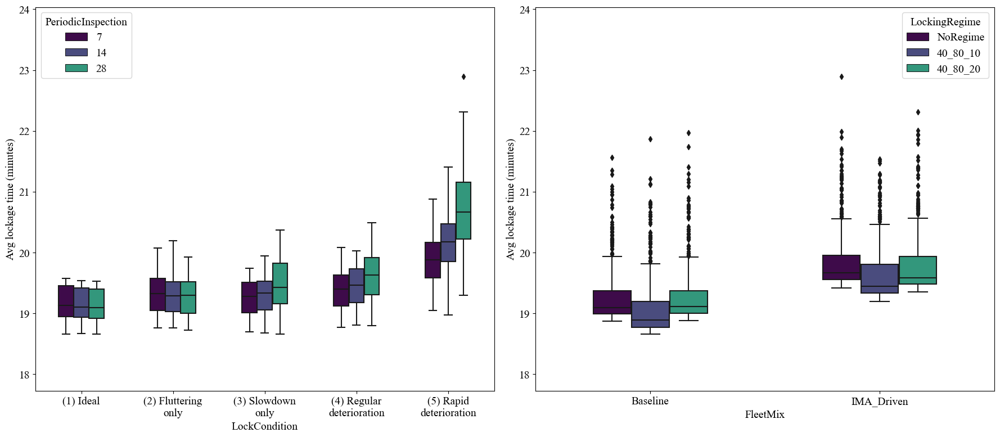

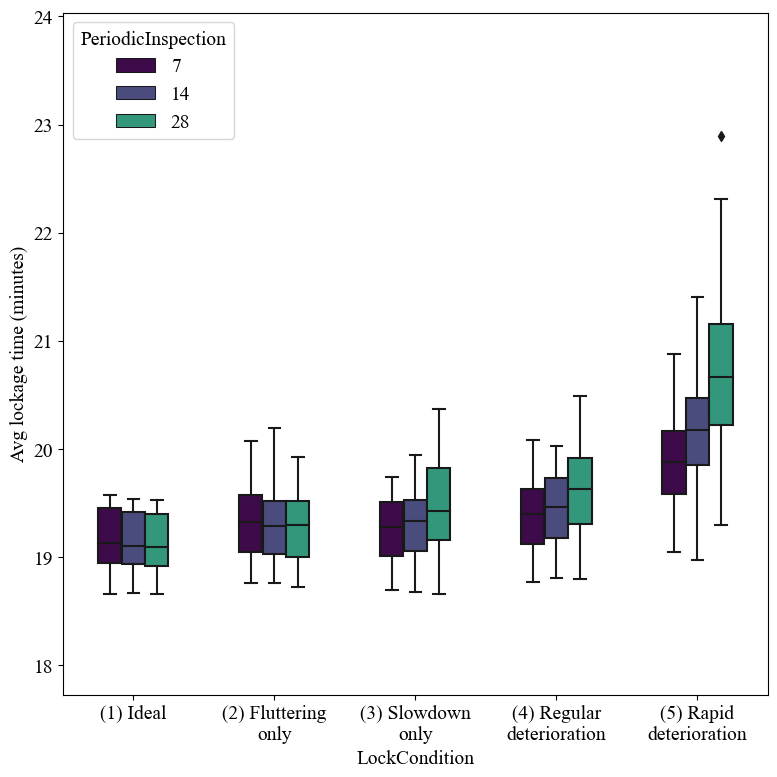

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Avg waiting time (minutes)


<Figure size 1600x1200 with 0 Axes>

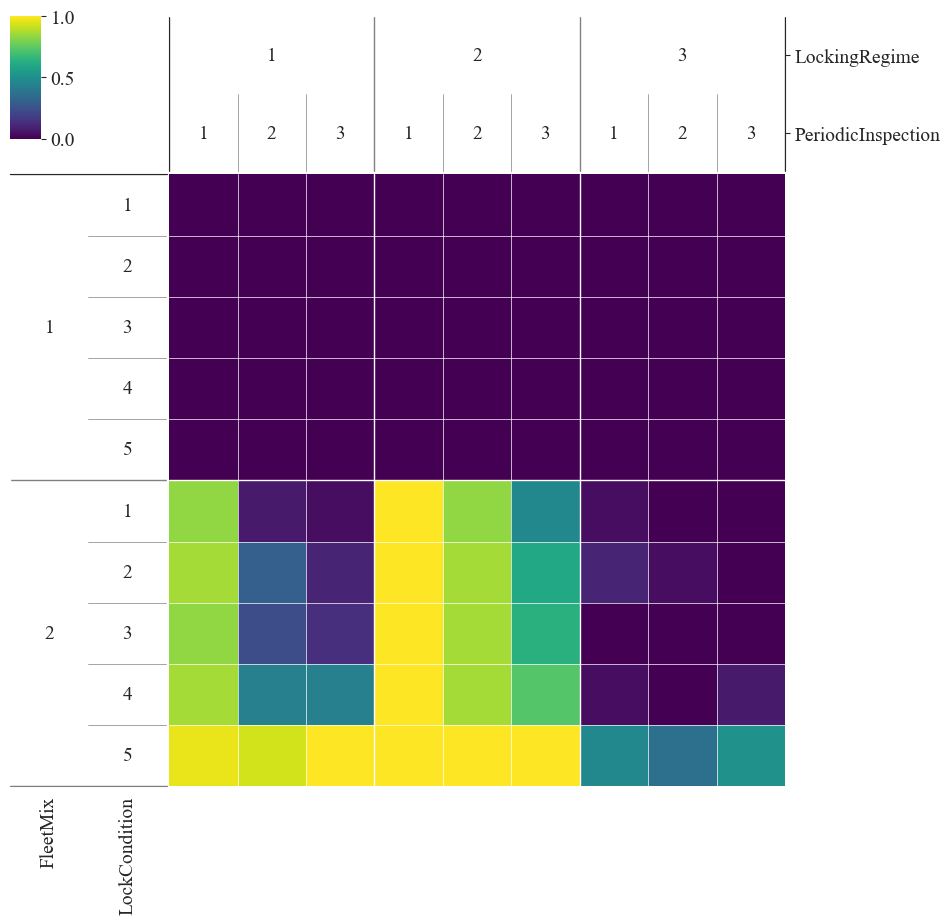

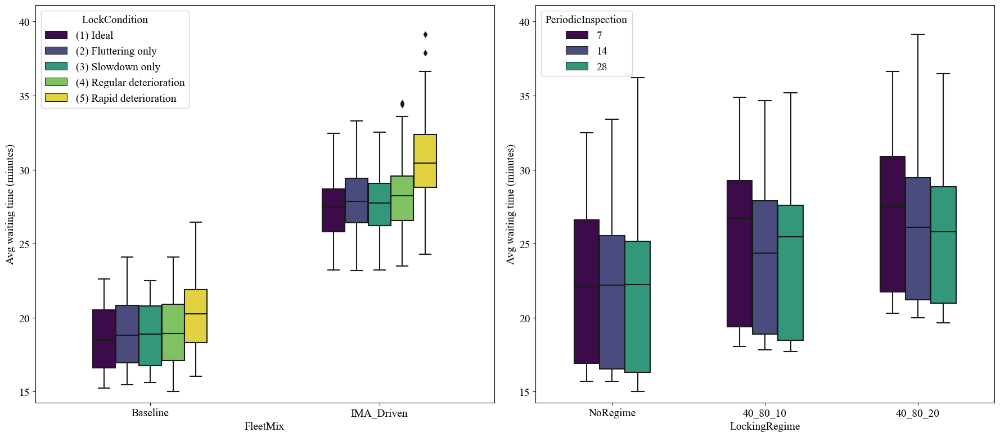

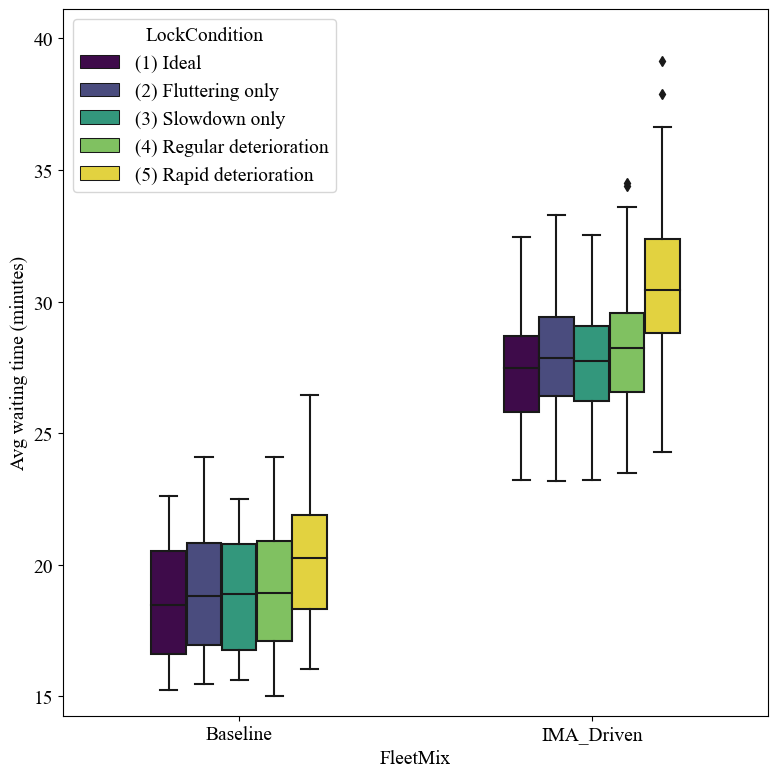

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Number of levelings


<Figure size 1600x1200 with 0 Axes>

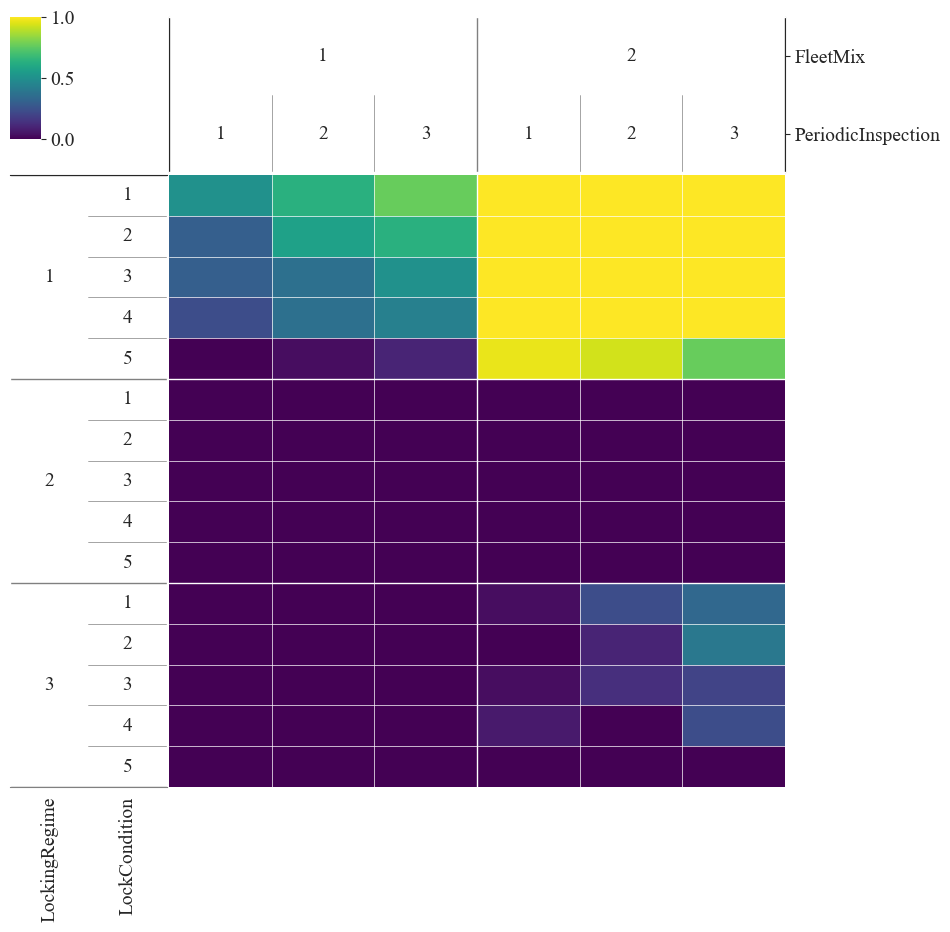

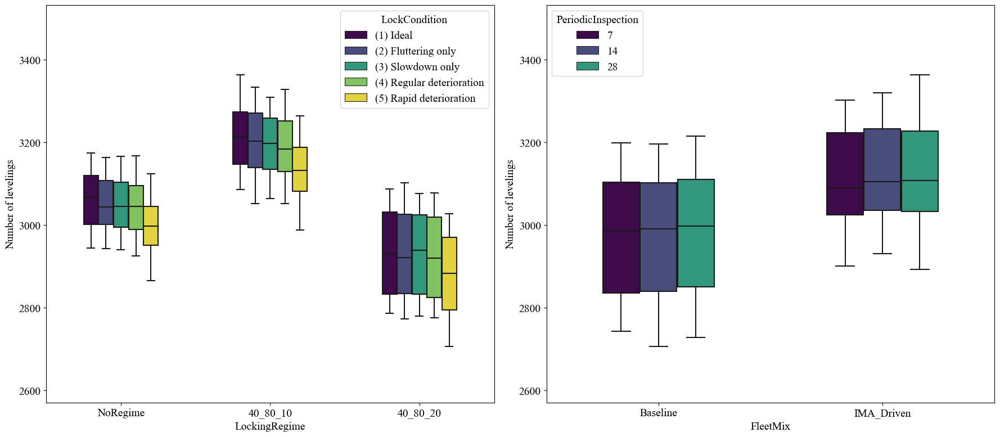

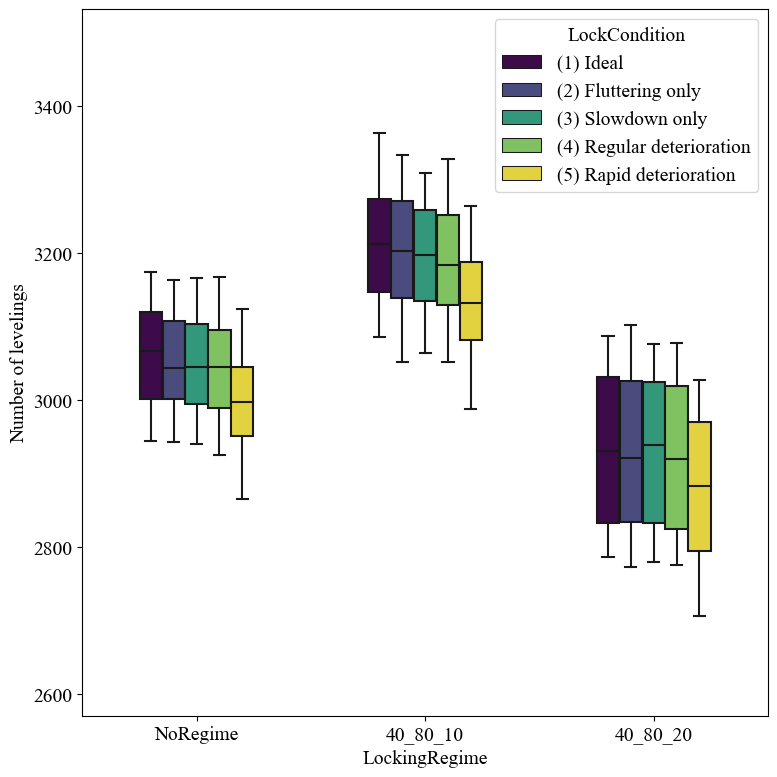

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Unavailability (hours)


<Figure size 1600x1200 with 0 Axes>

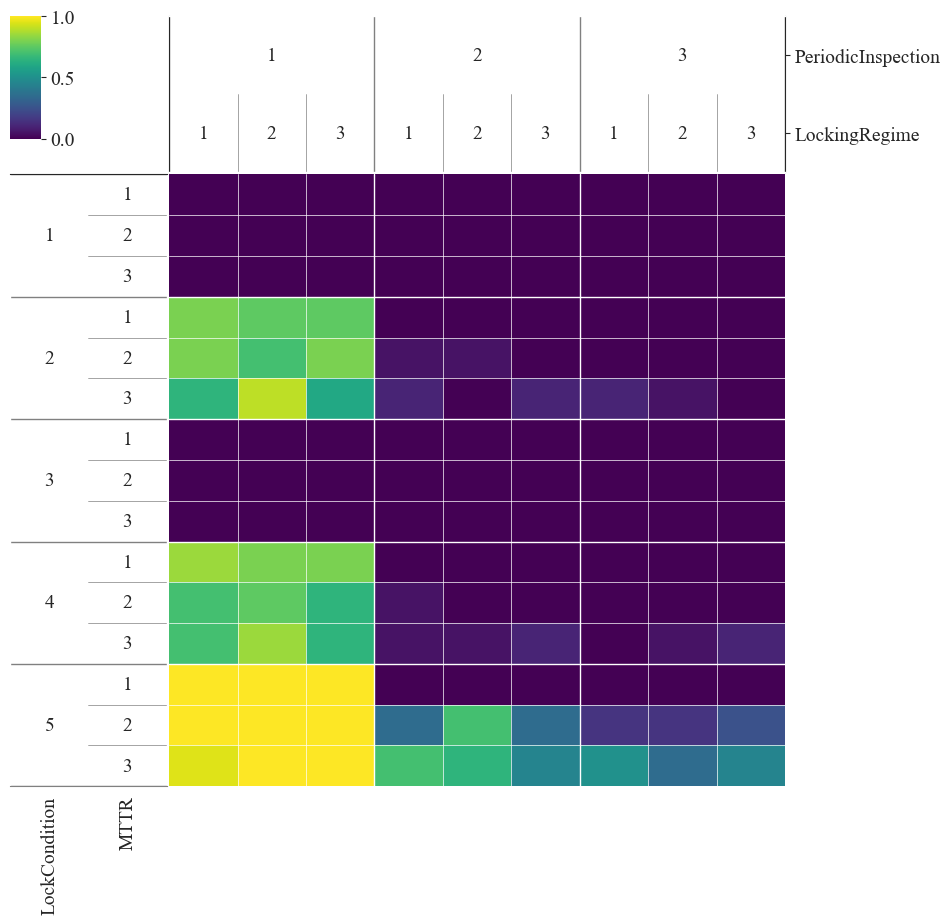

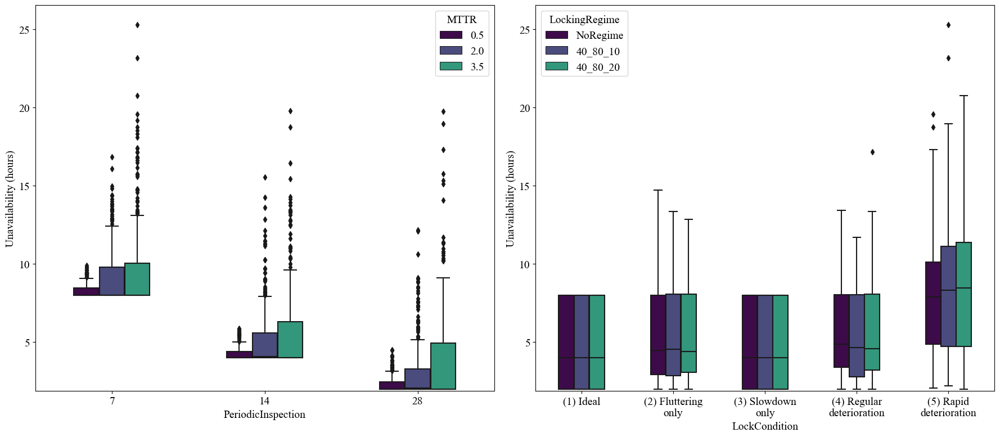

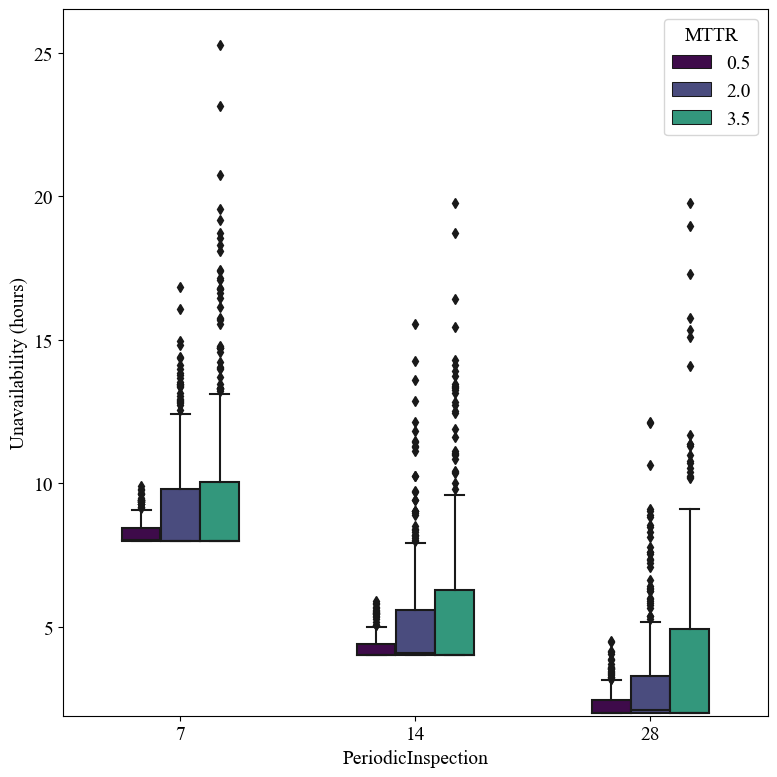

<Figure size 640x480 with 0 Axes>

In [29]:
for col_of_interest in cols_KPIs:
    print("---------------------------------------------------------------------------")
    print(col_of_interest)
    plot_dimensional_stacking_and_boxplots(experiments, col_of_interest, save_plots=True, plot_one=True)

---------------------------------------------------------------------------
CO2 emissions (kg/day)


<Figure size 1600x1200 with 0 Axes>

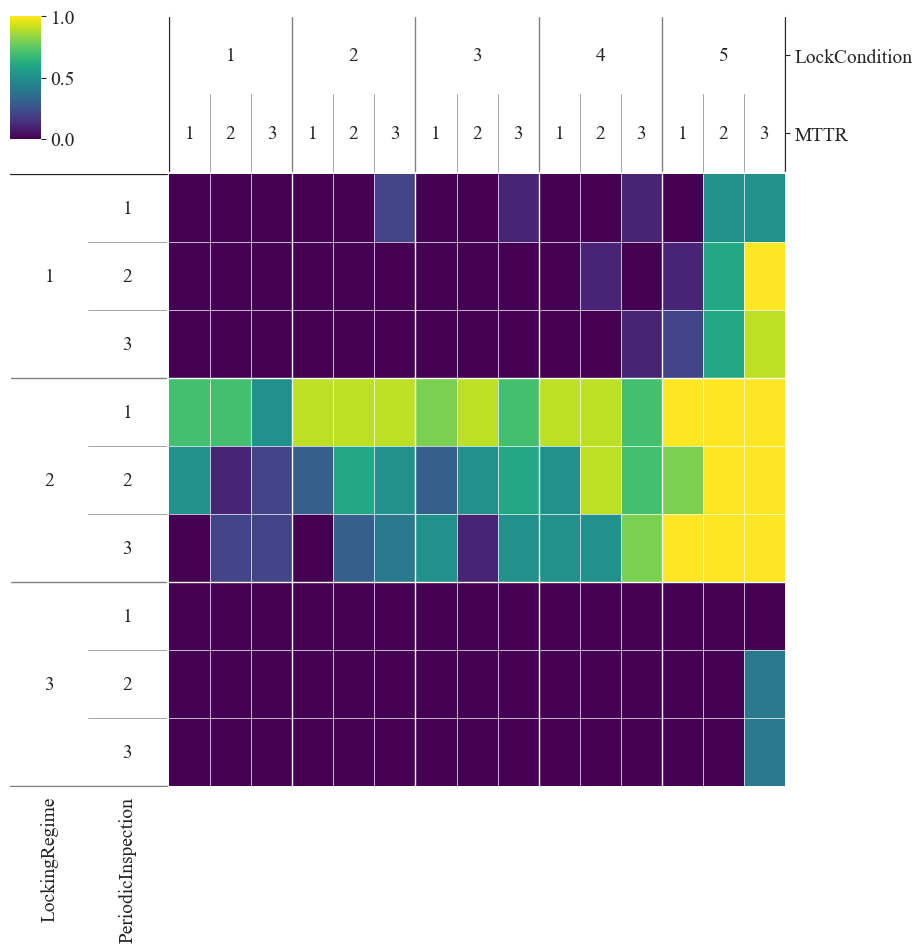

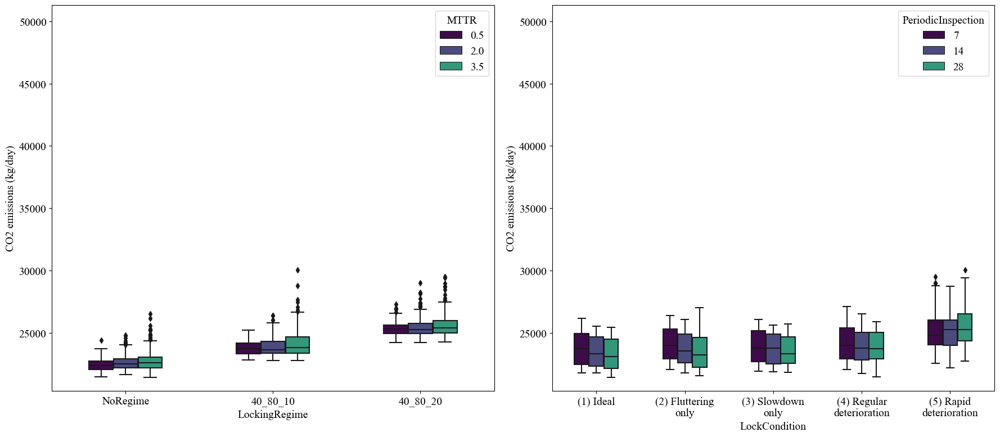

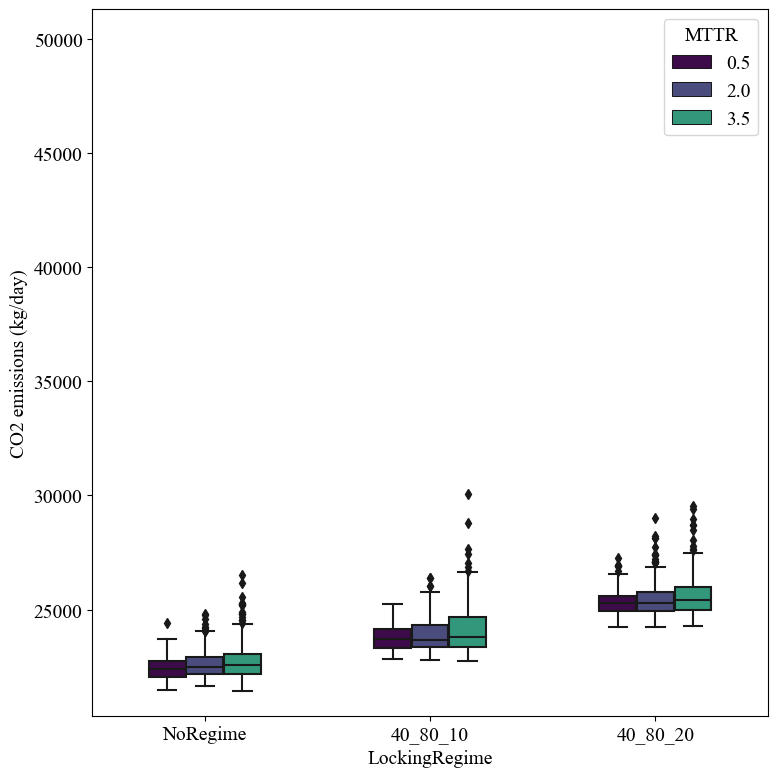

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Avg lockage time (minutes)


<Figure size 1600x1200 with 0 Axes>

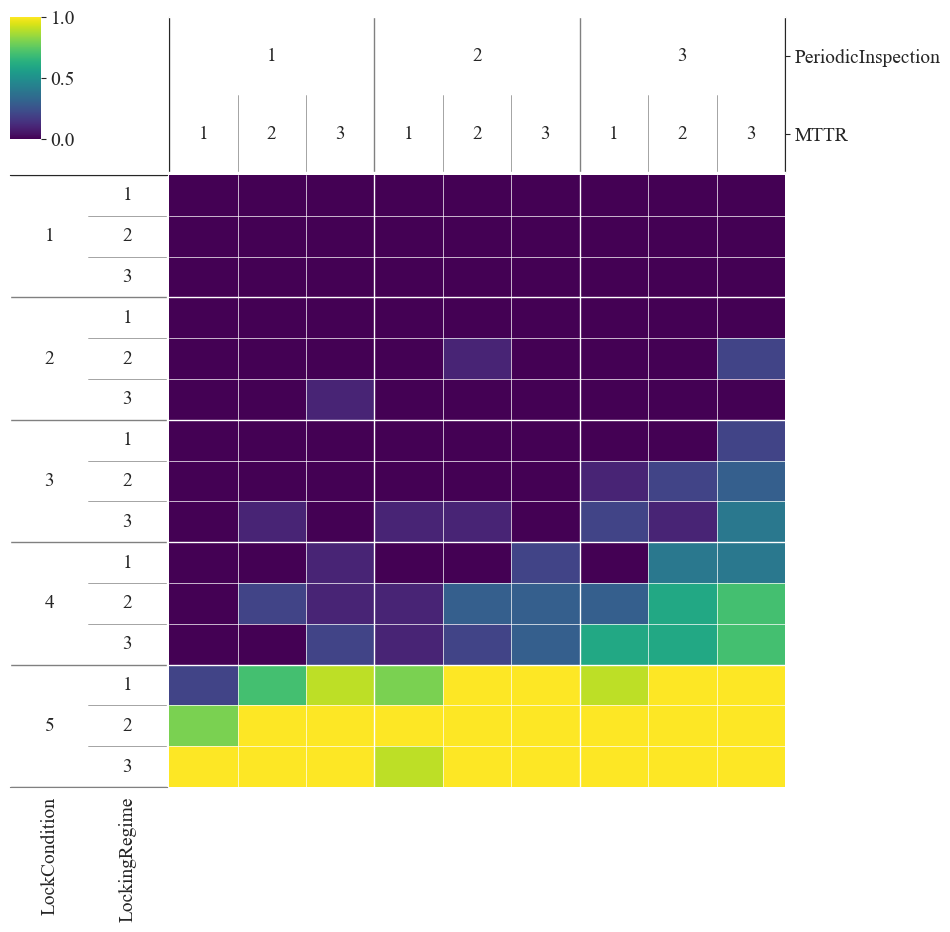

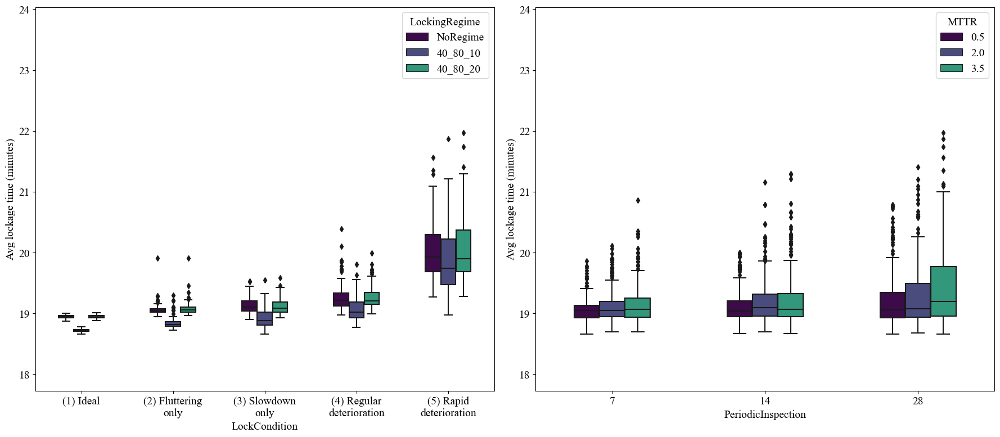

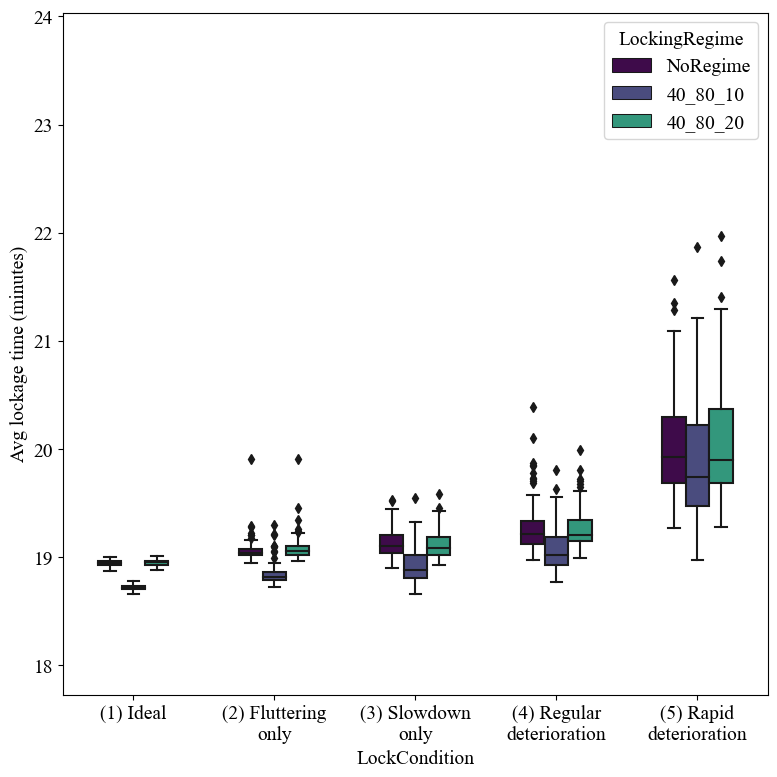

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Avg waiting time (minutes)


<Figure size 1600x1200 with 0 Axes>

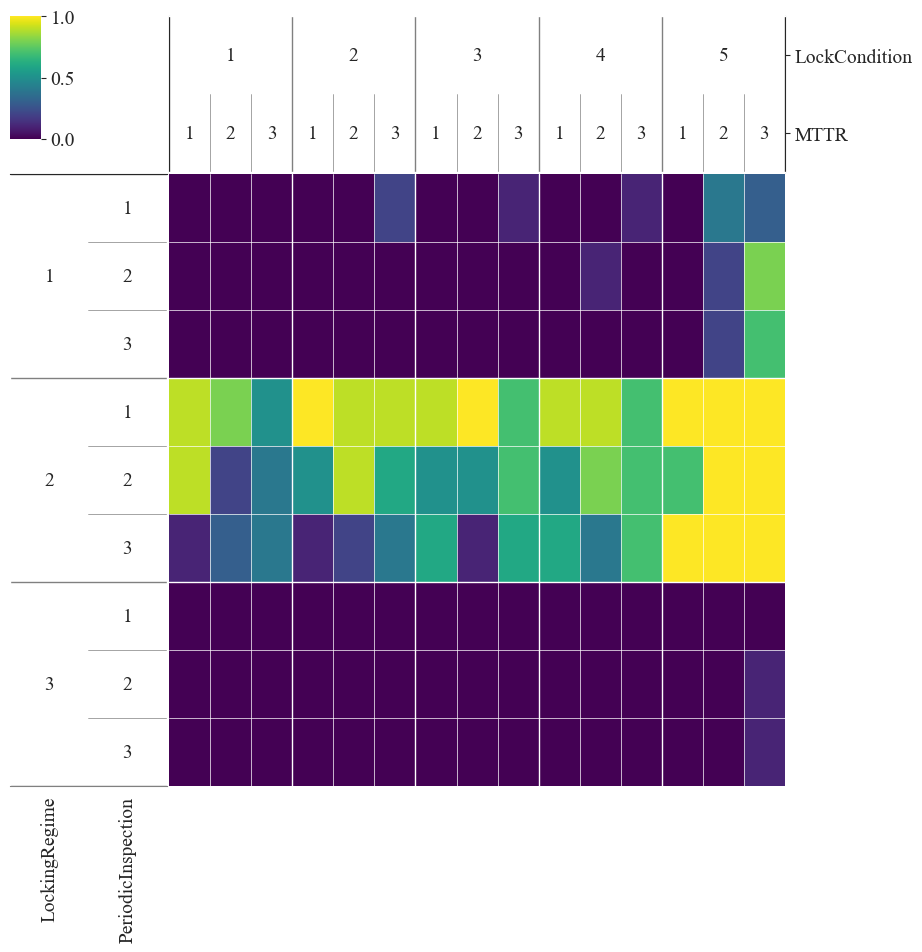

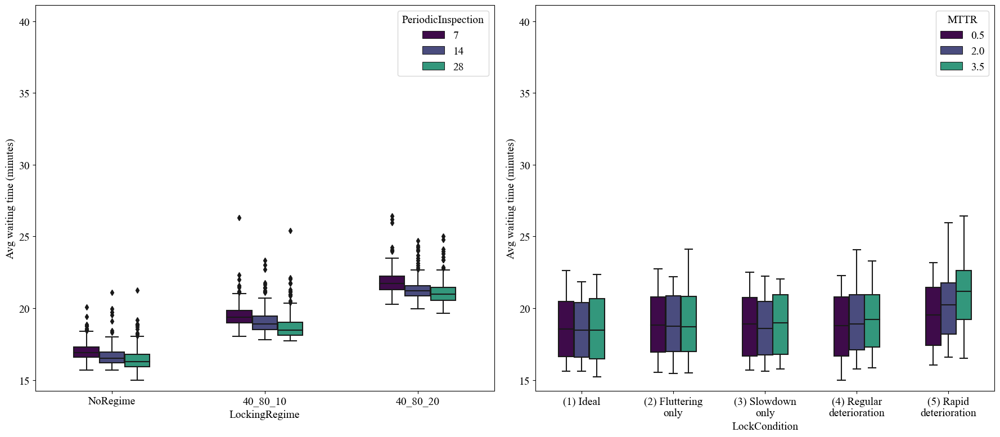

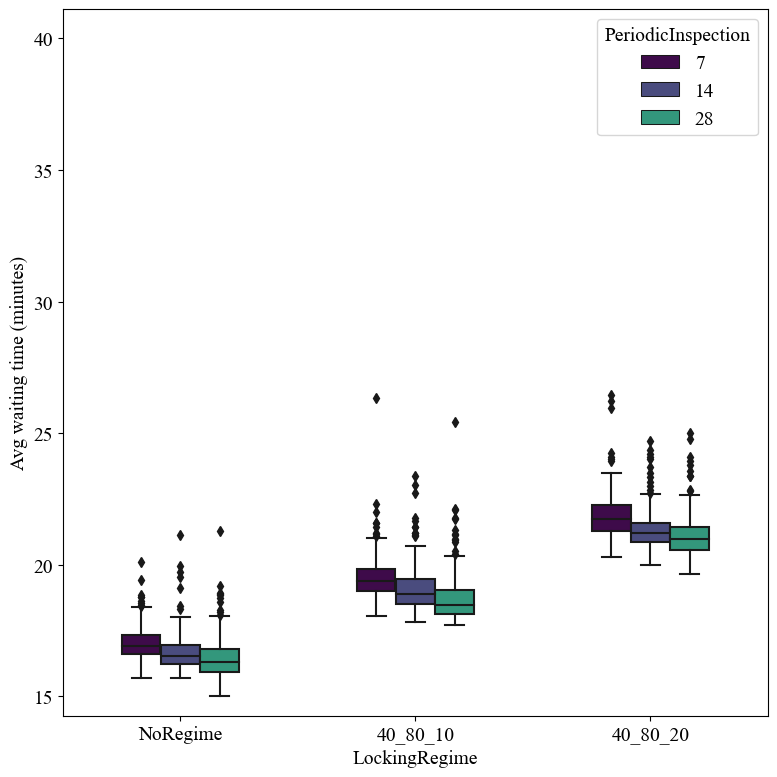

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Number of levelings


<Figure size 1600x1200 with 0 Axes>

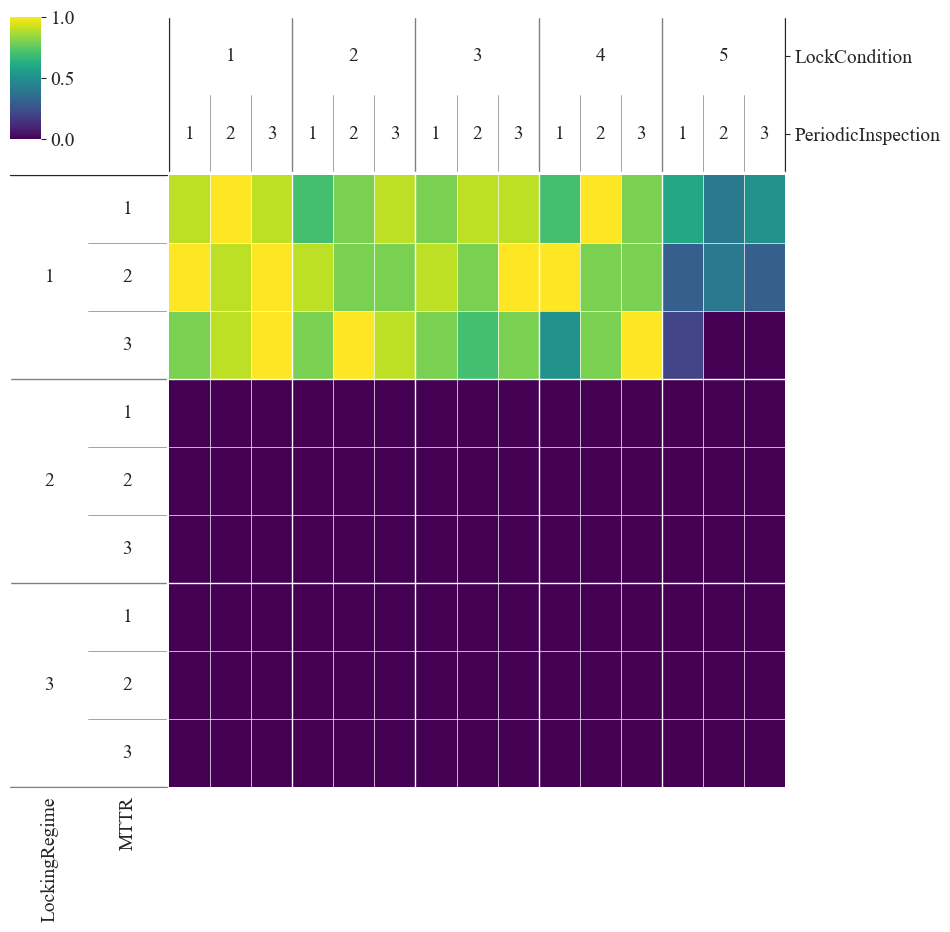

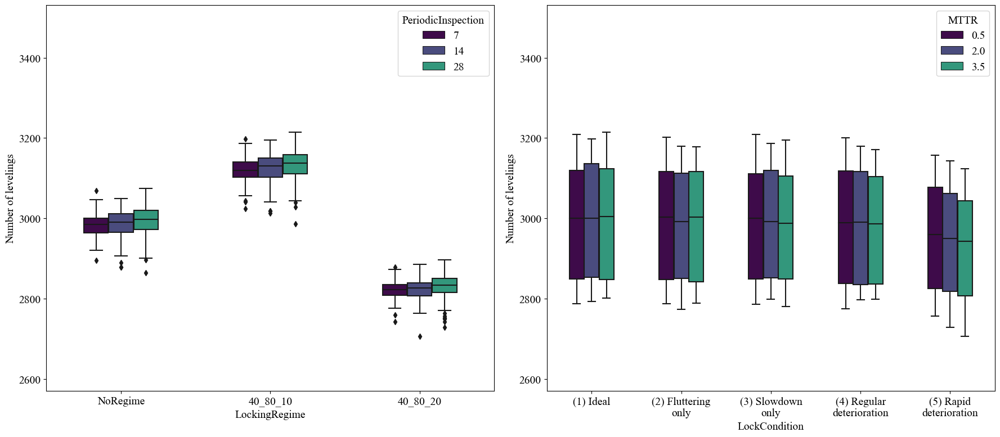

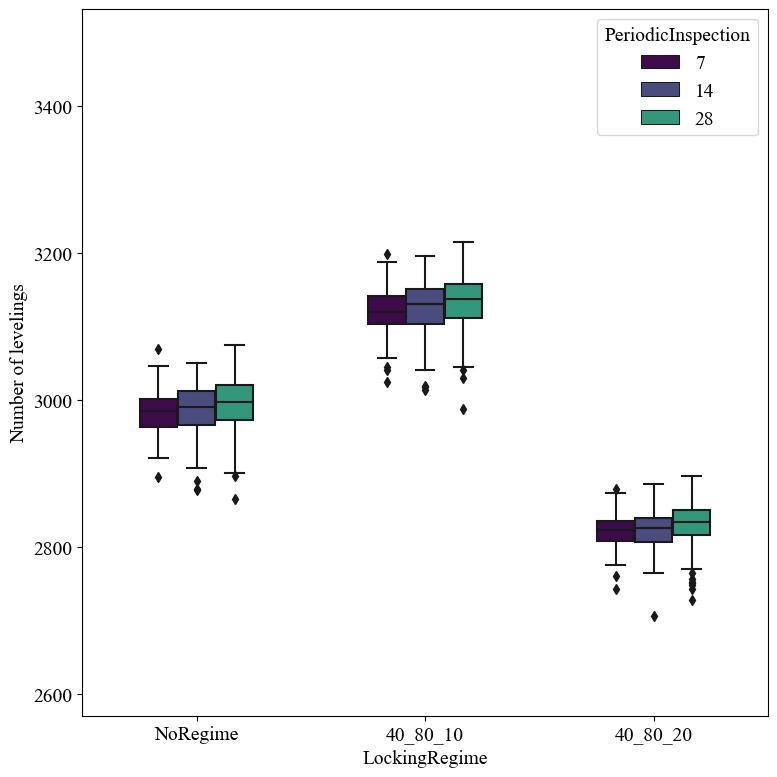

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Unavailability (hours)


<Figure size 1600x1200 with 0 Axes>

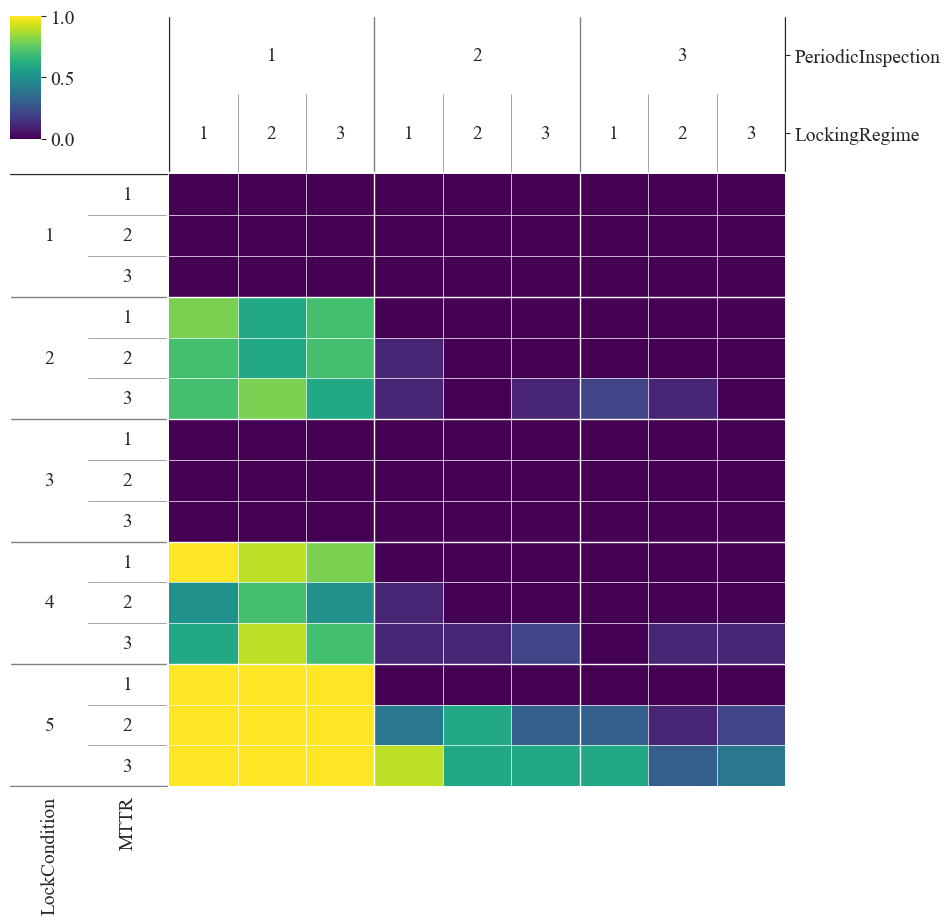

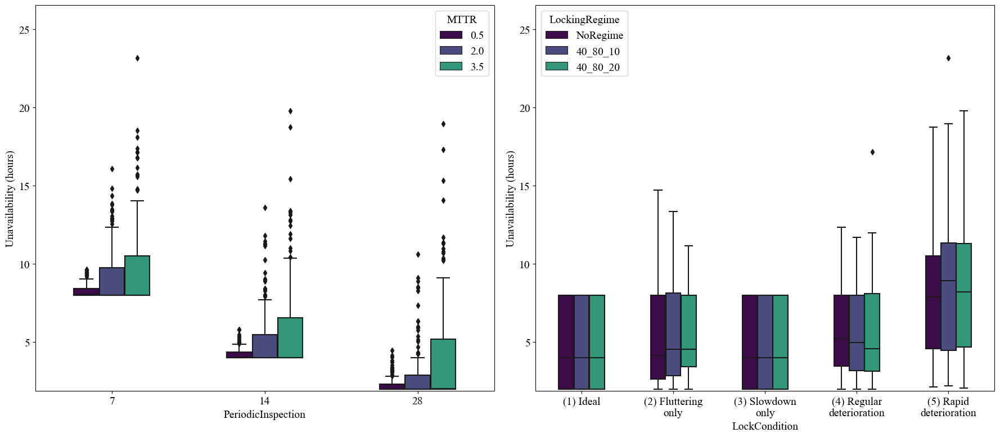

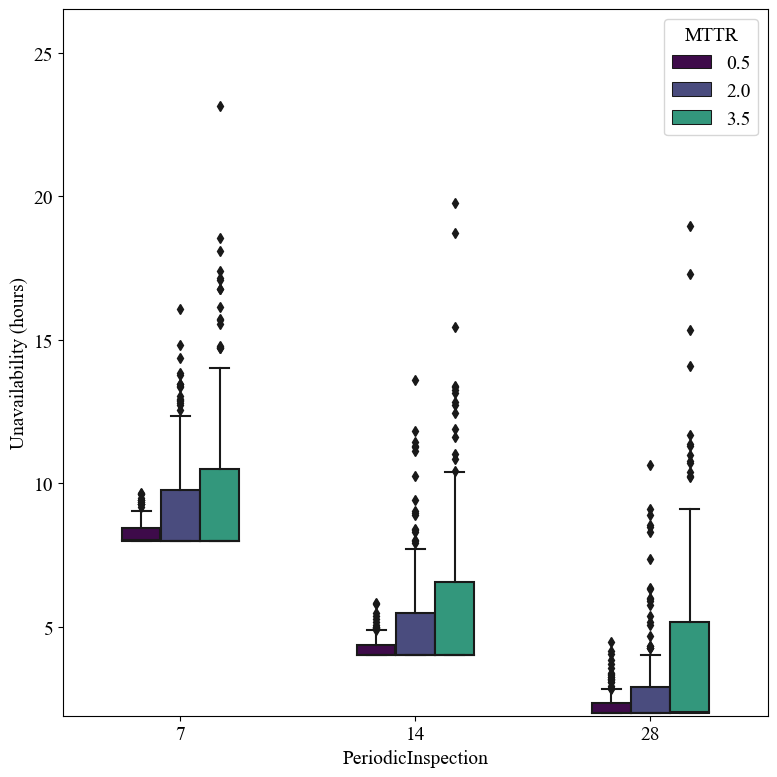

<Figure size 640x480 with 0 Axes>

In [30]:
for col_of_interest in cols_KPIs:
    print("---------------------------------------------------------------------------")
    print(col_of_interest)
    plot_dimensional_stacking_and_boxplots(experiments, col_of_interest, save_plots=True, plot_one=True, fleet_mix='Baseline')

---------------------------------------------------------------------------
CO2 emissions (kg/day)


<Figure size 1600x1200 with 0 Axes>

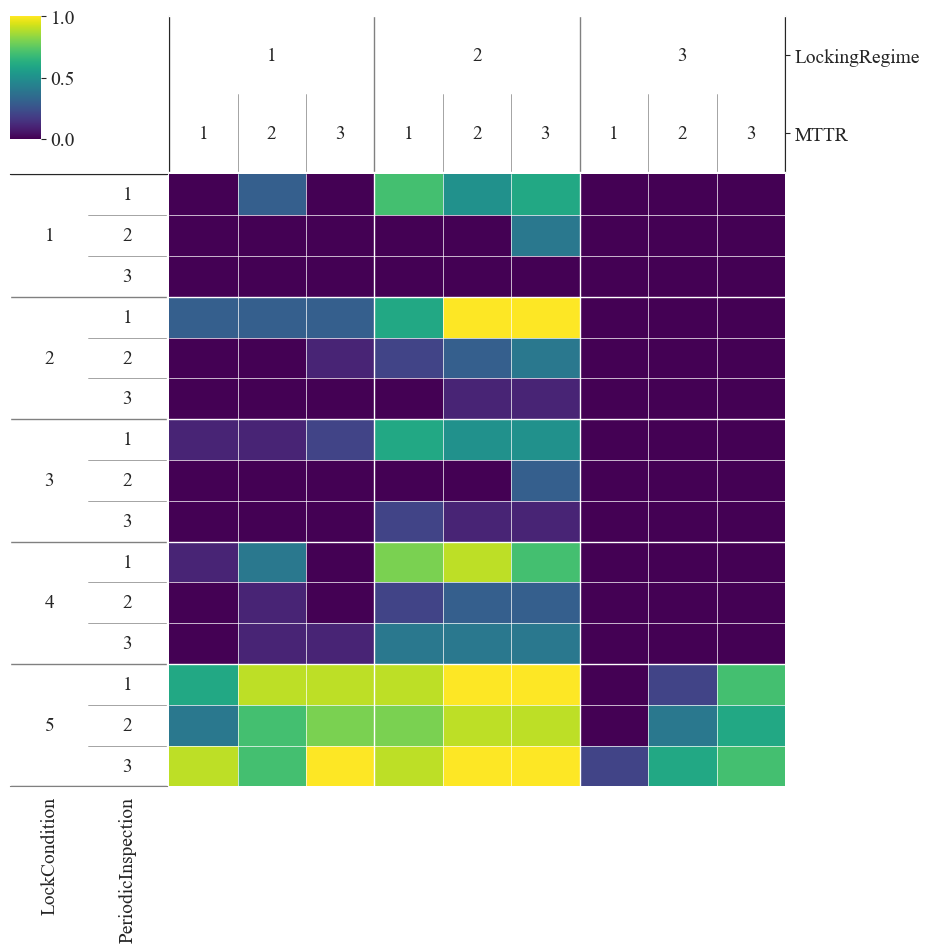

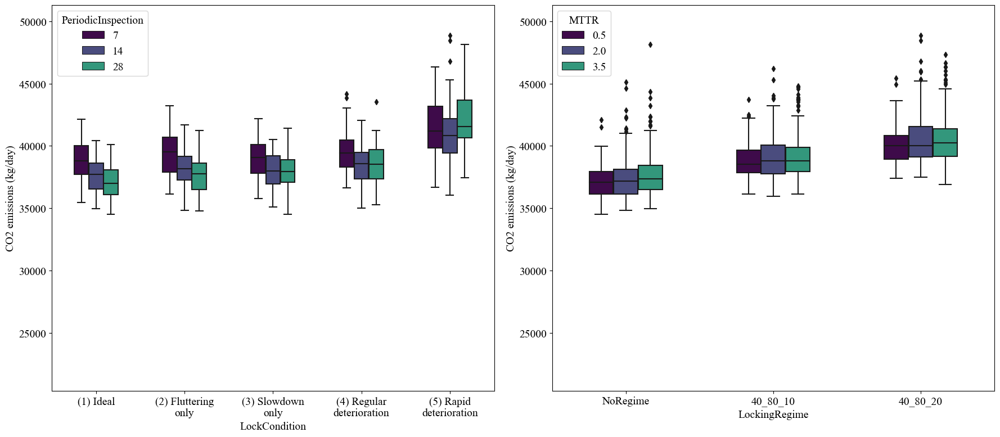

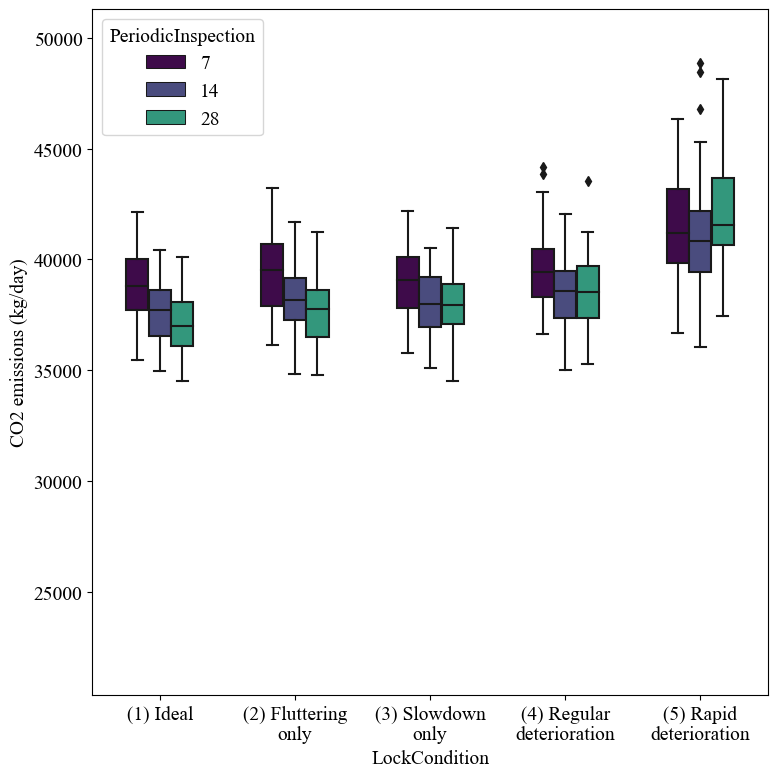

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Avg lockage time (minutes)


<Figure size 1600x1200 with 0 Axes>

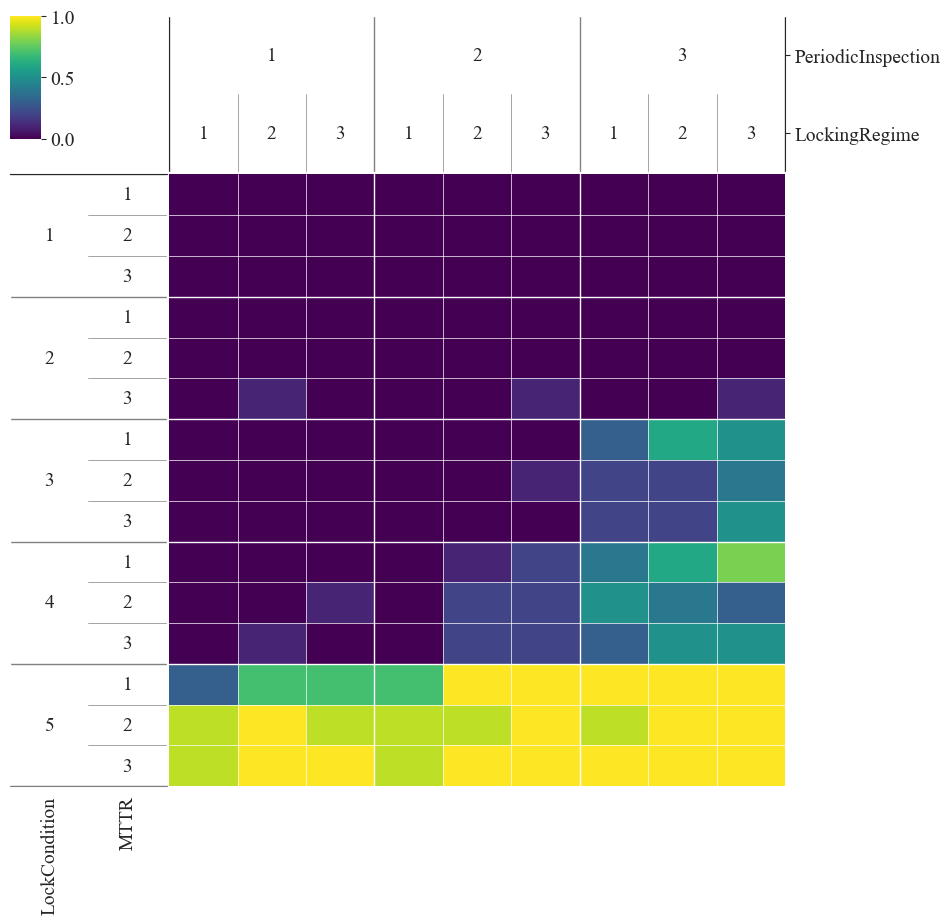

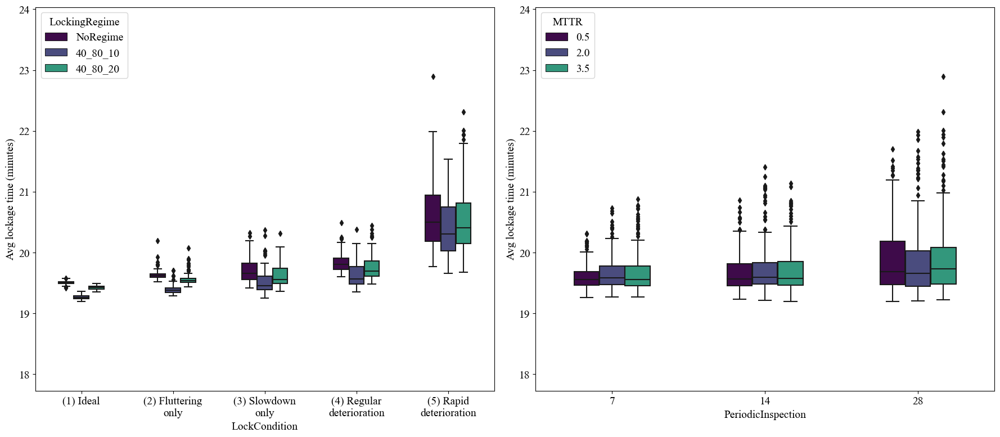

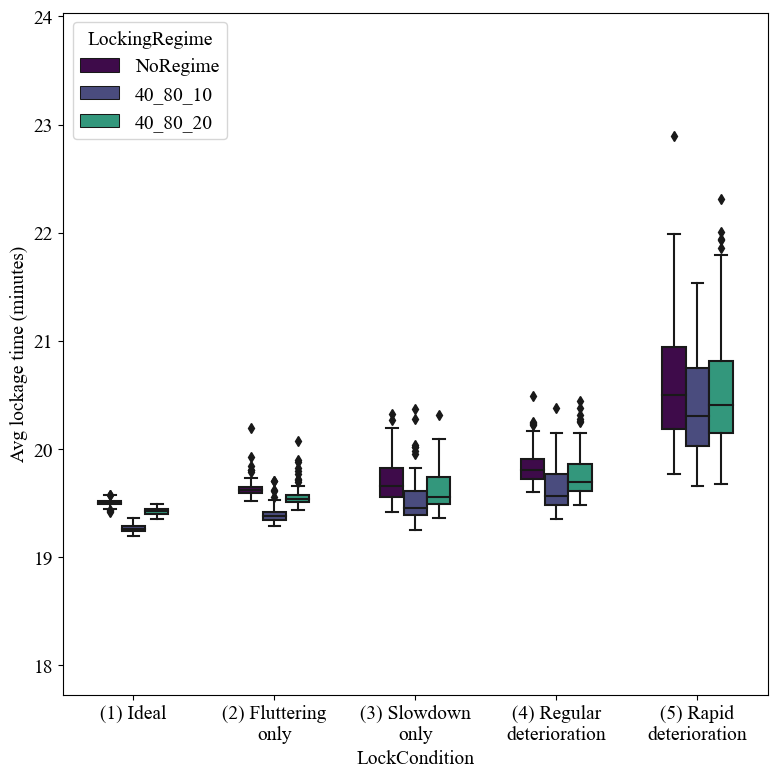

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Avg waiting time (minutes)


<Figure size 1600x1200 with 0 Axes>

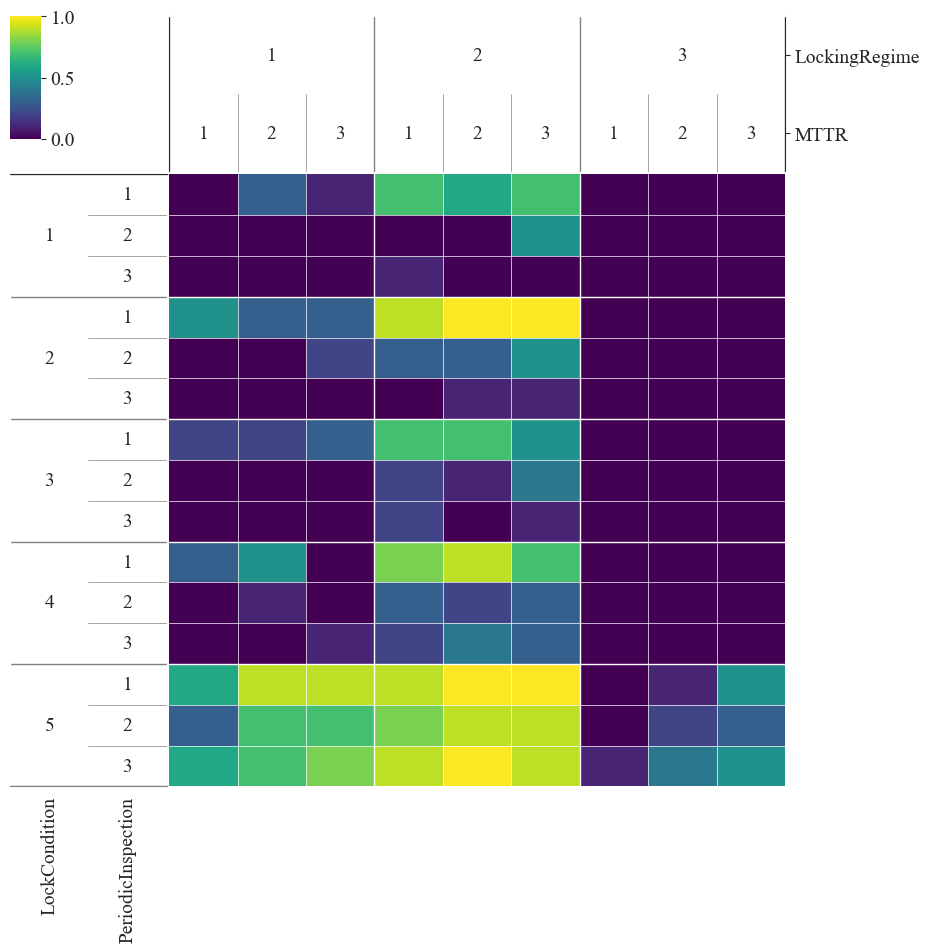

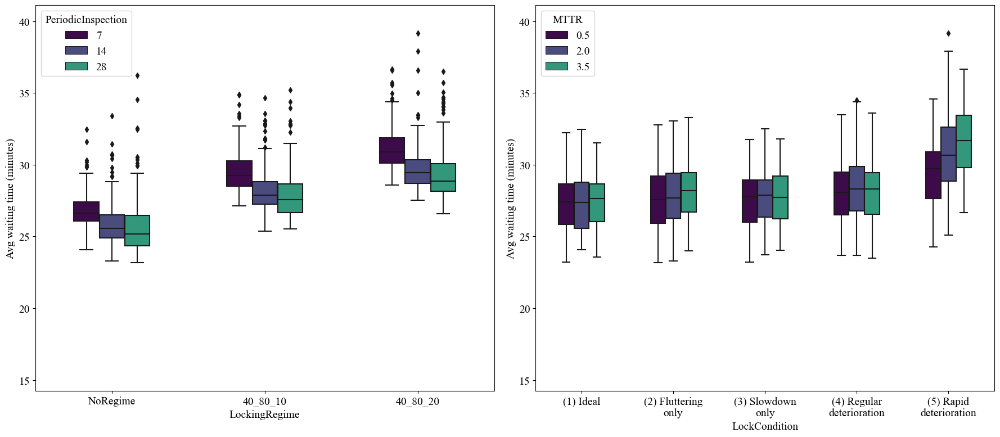

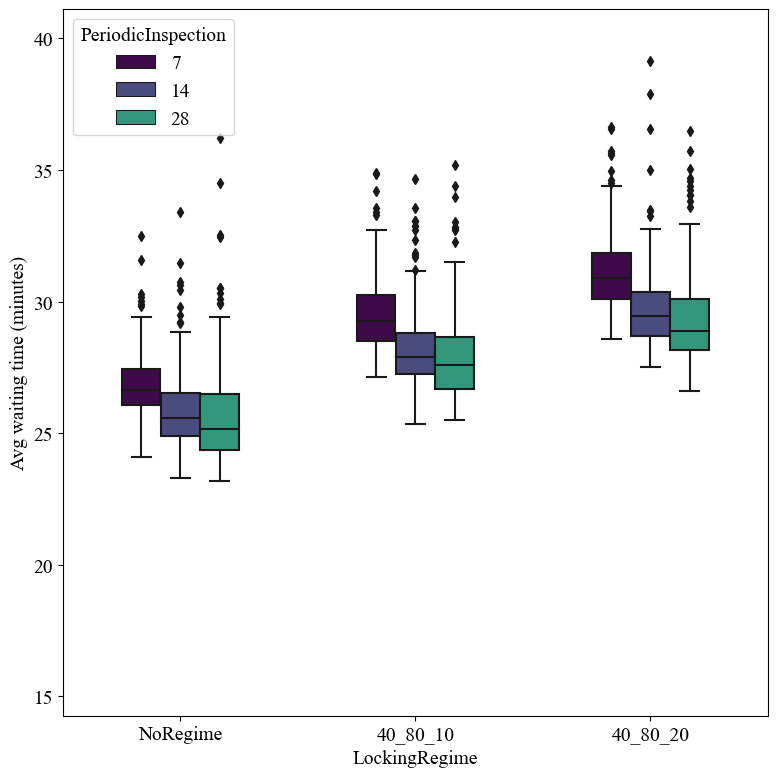

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Number of levelings


<Figure size 1600x1200 with 0 Axes>

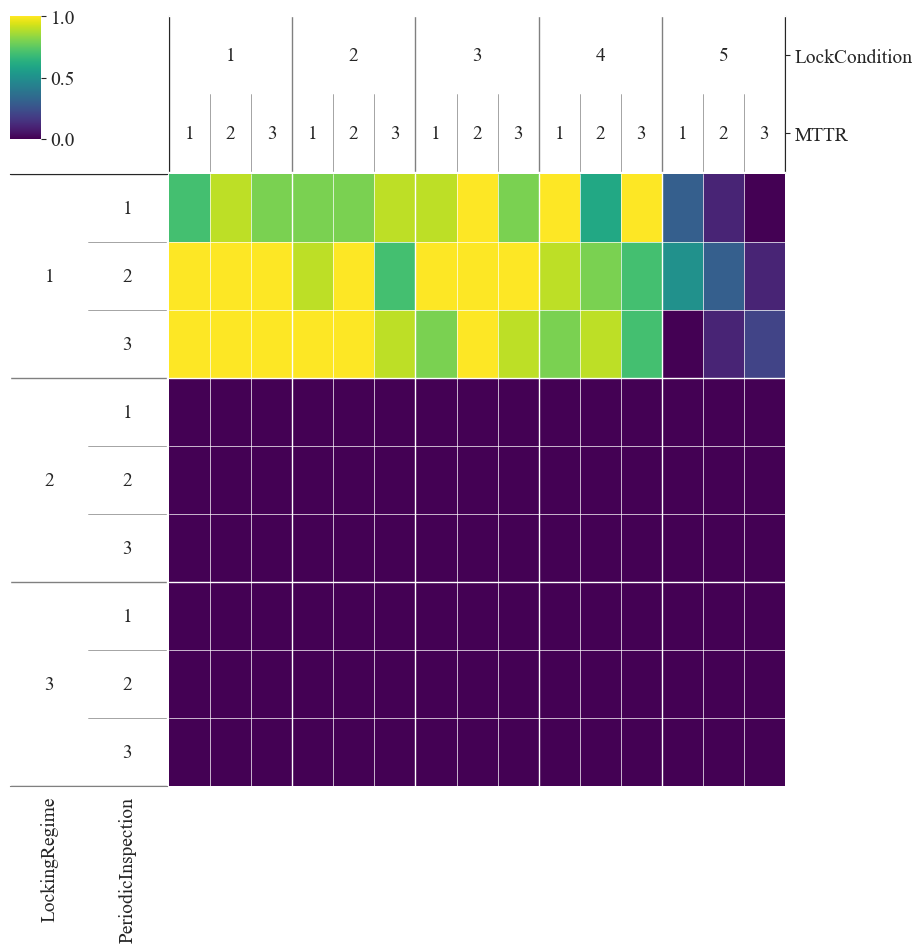

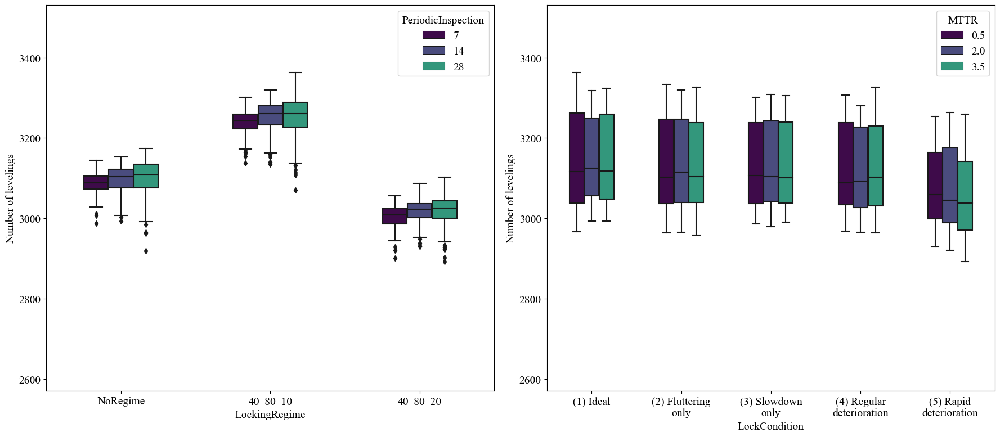

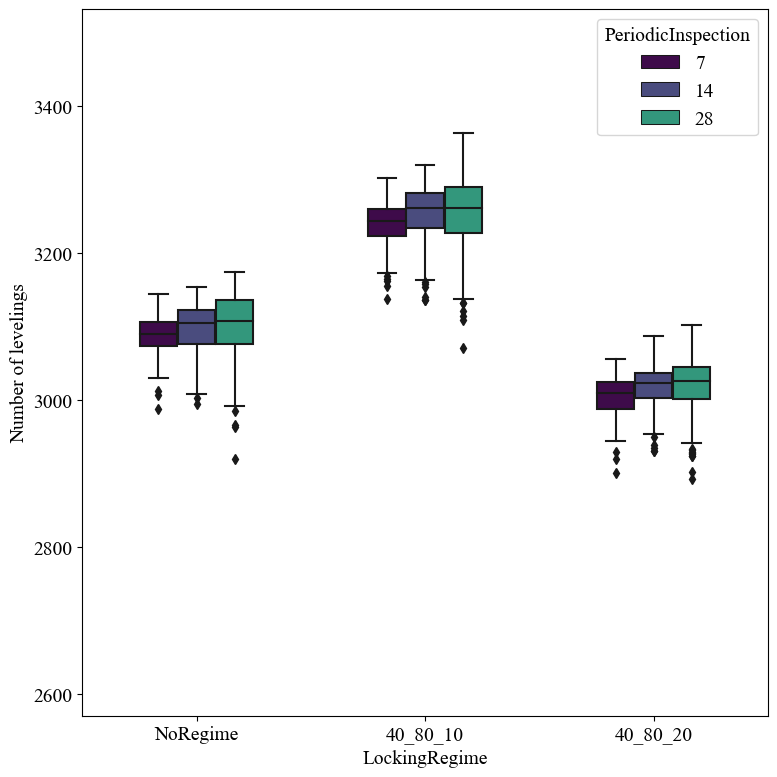

<Figure size 640x480 with 0 Axes>

---------------------------------------------------------------------------
Unavailability (hours)


<Figure size 1600x1200 with 0 Axes>

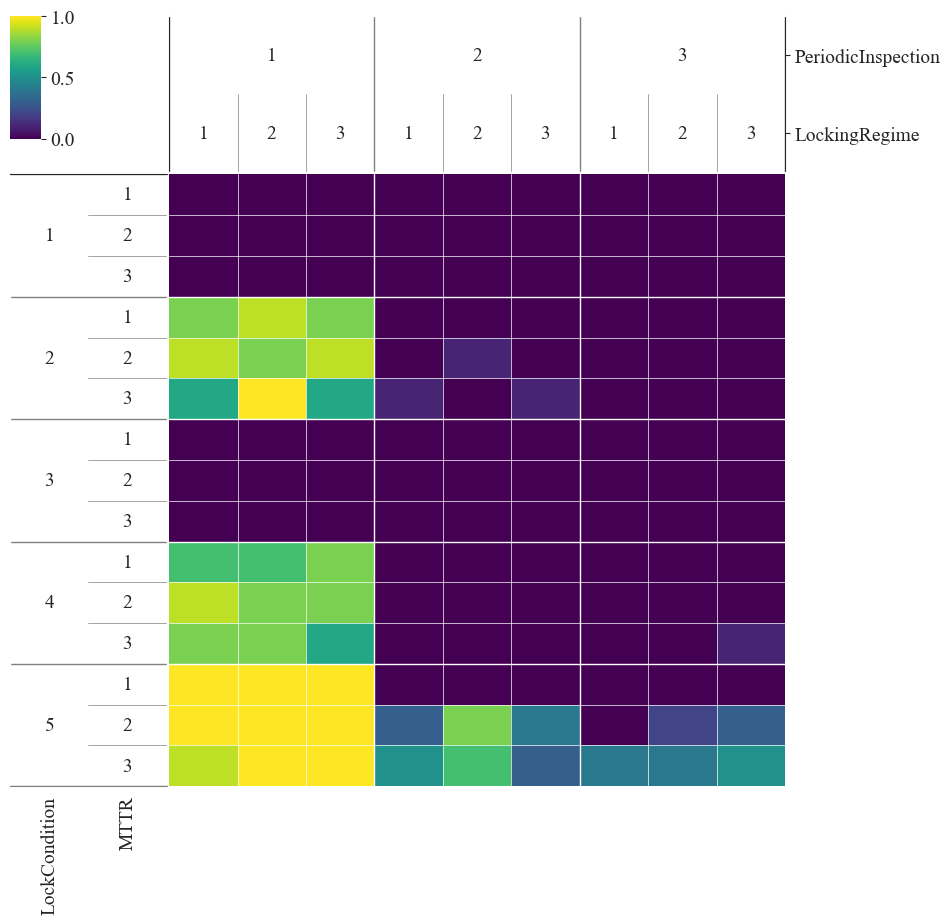

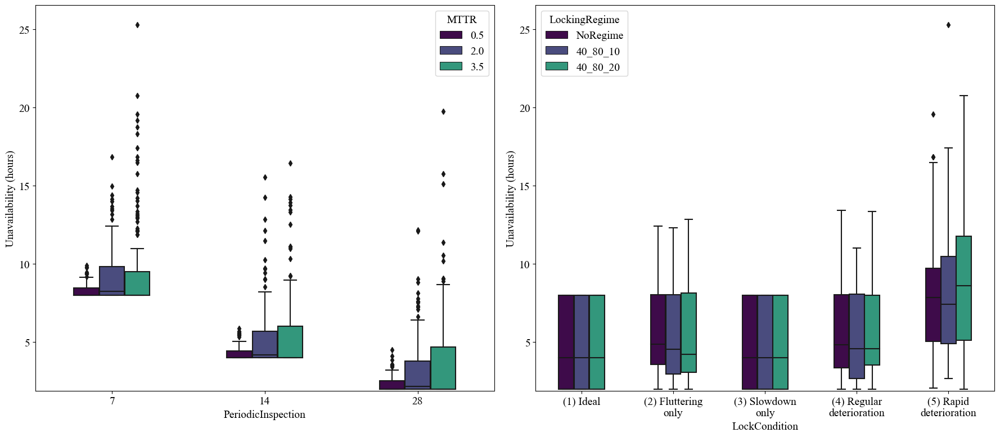

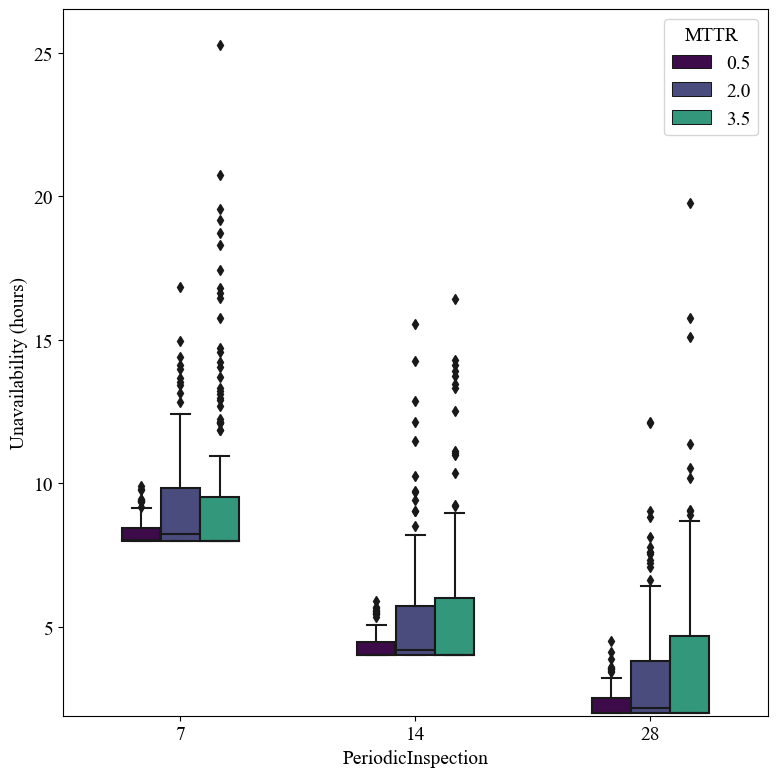

<Figure size 640x480 with 0 Axes>

In [31]:
for col_of_interest in cols_KPIs:
    print("---------------------------------------------------------------------------")
    print(col_of_interest)
    plot_dimensional_stacking_and_boxplots(experiments, col_of_interest, save_plots=True, plot_one=True, fleet_mix='IMA_Driven')

In [32]:
def plot_maintenance_vs_lock(col_of_interest, normalize_yaxis=True, save_loc=''):
    for i, fleet_mix in enumerate(list(experiments.FleetMix.unique())):
        df = experiments[(experiments['FleetMix']== fleet_mix) & 
                        (experiments['LockCondition'].isin(['(1) Ideal', '(4) Regular deterioration', '(5) Rapid deterioration']))]
        print(fleet_mix)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

        sns.boxplot(y=col_of_interest, x='FlutteringProbability', hue='MTTR', data=df, palette=viridis_colors, width=0.5, ax=ax1)
        sns.boxplot(y=col_of_interest, x='SlowDownEffect', hue='PeriodicInspection', data=df, palette=viridis_colors, width=0.5, ax=ax2)
        ax1.set_xticklabels(['Ideal', 'Regular deterioration', 'Rapid deterioration'])
        ax2.set_xticklabels(['Ideal', 'Regular deterioration', 'Rapid deterioration'])
        
        # fig.suptitle(fleet_mix_dict[fleet_mix])
        if normalize_yaxis==True:
            ax1.set_ylim(lim_dict[ax1.get_ylabel()])
            ax2.set_ylim(lim_dict[ax2.get_ylabel()])

        if save_loc != '':
            plt.tight_layout()
            plt.savefig(save_loc + fleet_mix + '/lock_condition_vs_maintenance_policies.pdf')

        plt.show()

Baseline


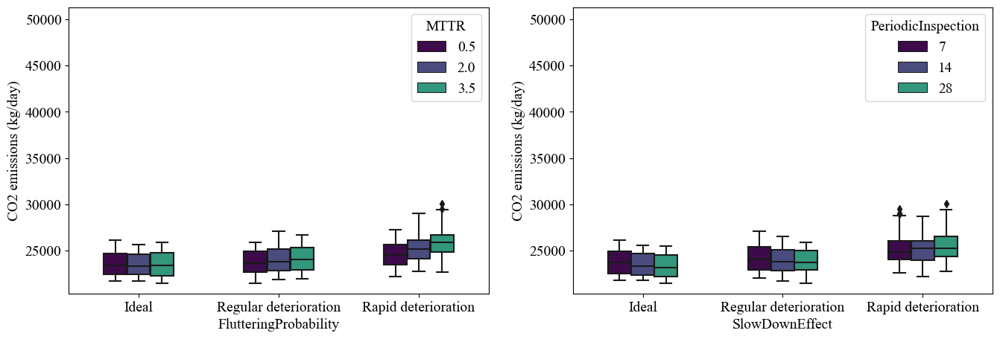

IMA_Driven


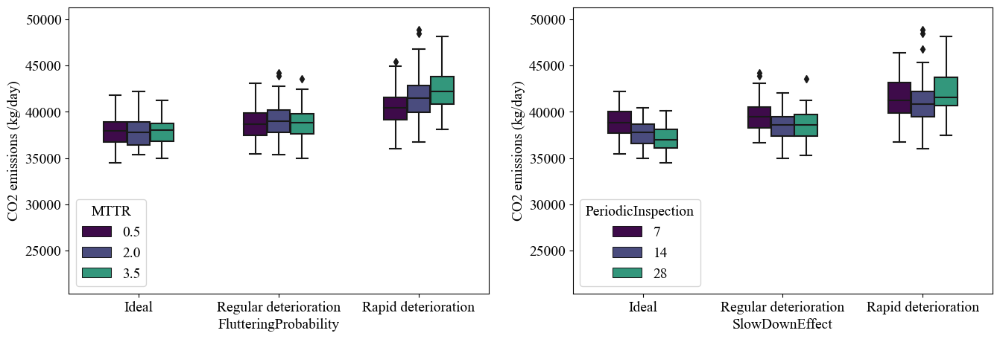

In [34]:
plot_maintenance_vs_lock("CO2 emissions (kg/day)")

Baseline


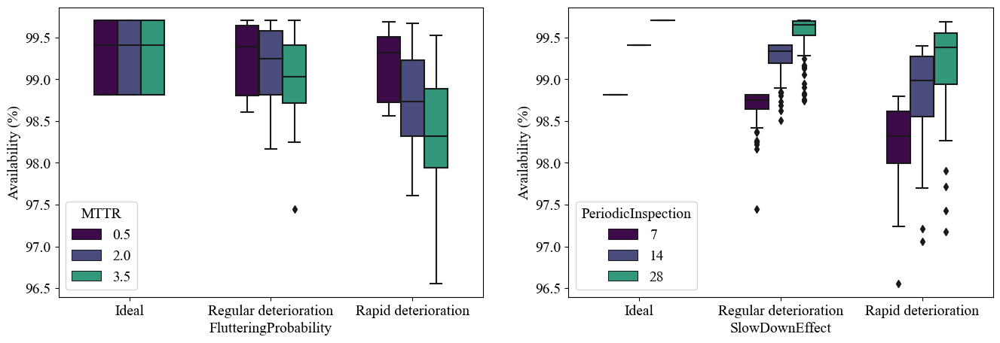

IMA_Driven


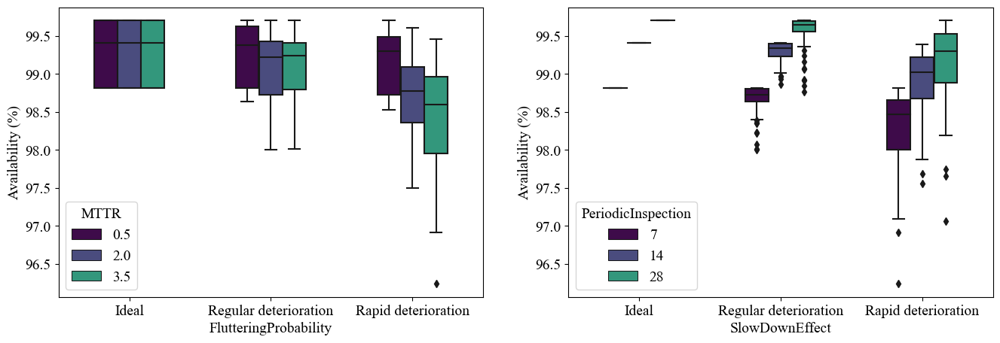

In [35]:
plot_maintenance_vs_lock("Availability (%)", normalize_yaxis=False)


Baseline


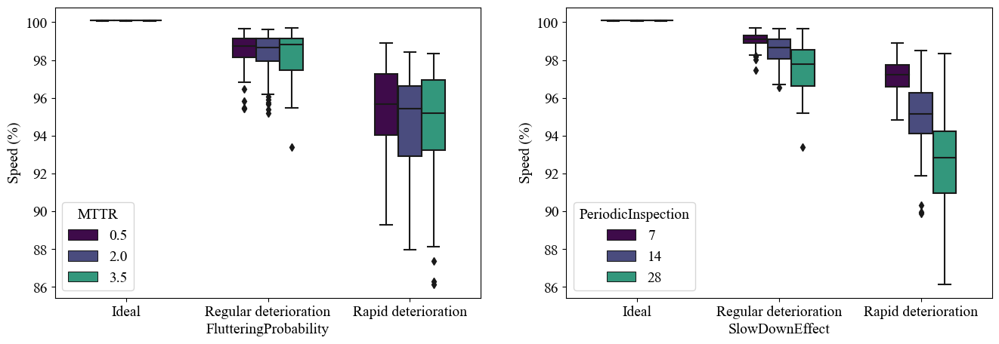

IMA_Driven


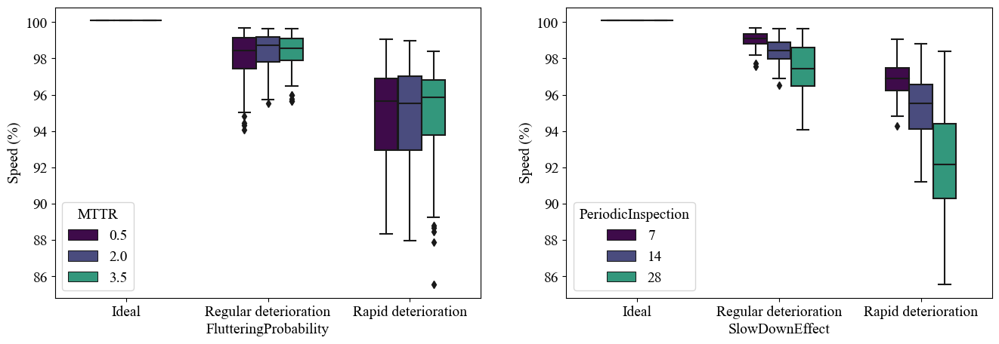

In [36]:
plot_maintenance_vs_lock("Speed (%)", normalize_yaxis=False)

Baseline


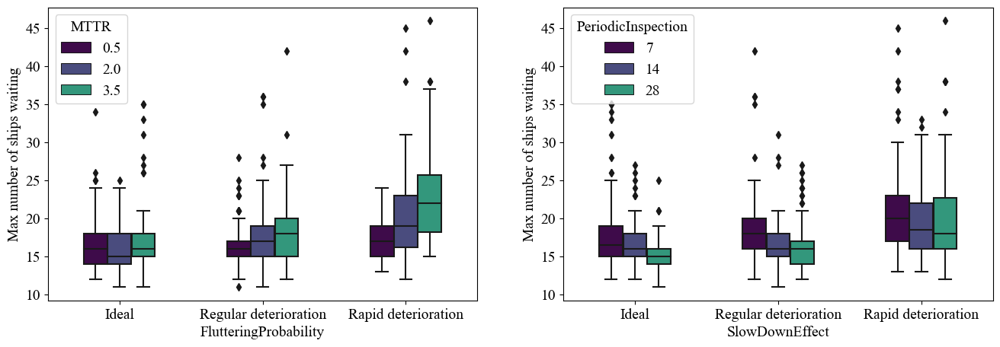

IMA_Driven


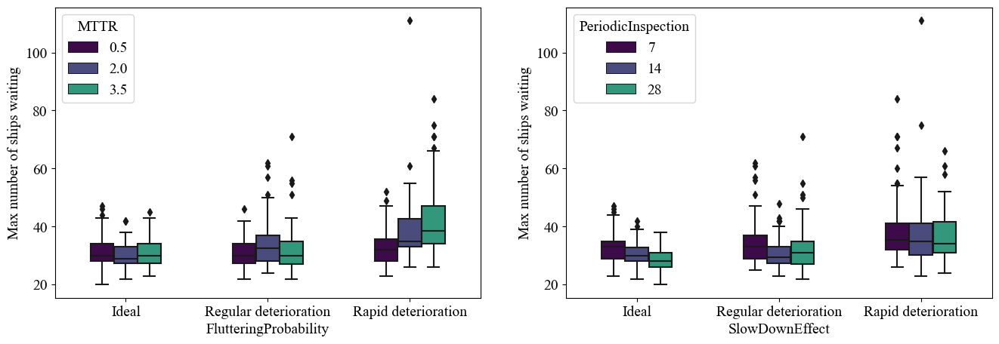

In [37]:
plot_maintenance_vs_lock("Max number of ships waiting", normalize_yaxis=False)

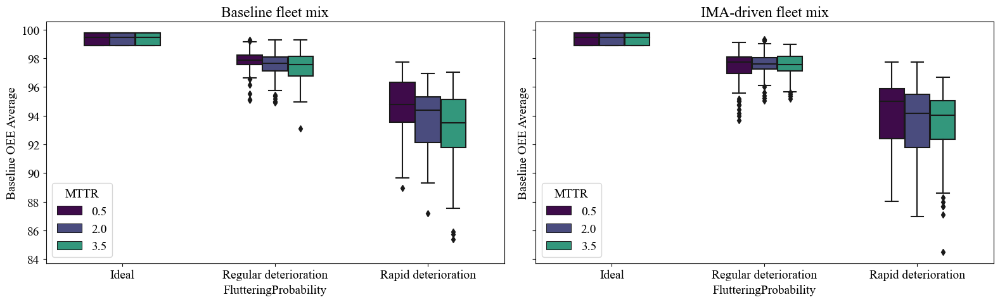

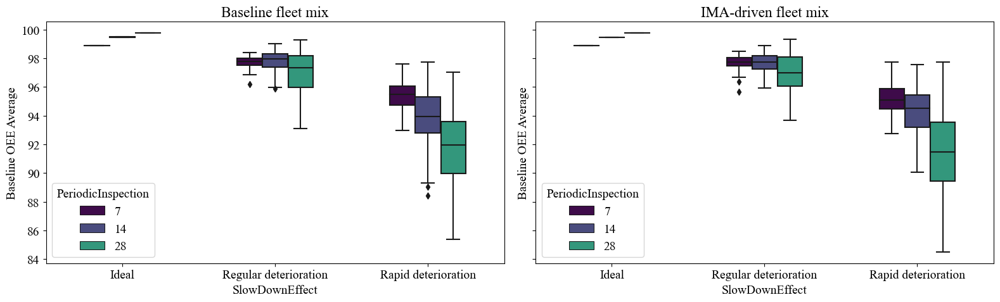

In [38]:
col_of_interest = "Baseline OEE Average"

df_baseline = experiments[(experiments['FleetMix']== 'Baseline') & 
                (experiments['LockCondition'].isin(['(1) Ideal', '(4) Regular deterioration', '(5) Rapid deterioration']))]

df_ima = experiments[(experiments['FleetMix']== 'IMA_Driven') & 
                (experiments['LockCondition'].isin(['(1) Ideal', '(4) Regular deterioration', '(5) Rapid deterioration']))]


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(y=col_of_interest, x='FlutteringProbability', hue='MTTR', data=df_baseline, palette=viridis_colors, width=0.5, ax=ax1)
sns.boxplot(y=col_of_interest, x='FlutteringProbability', hue='MTTR', data=df_ima, palette=viridis_colors, width=0.5, ax=ax2)
ax1.set_xticklabels(['Ideal', 'Regular deterioration', 'Rapid deterioration'])
ax2.set_xticklabels(['Ideal', 'Regular deterioration', 'Rapid deterioration'])
ax1.set_title('Baseline fleet mix')
ax2.set_title('IMA-driven fleet mix')
plt.tight_layout()
plt.savefig('output/figs/output_analysis/main_experiment/OEE/lock_condition_vs_mttr.pdf')
plt.show()


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5), sharey=True)
sns.boxplot(y=col_of_interest, x='SlowDownEffect', hue='PeriodicInspection', data=df_baseline, palette=viridis_colors, width=0.5, ax=ax1)
sns.boxplot(y=col_of_interest, x='SlowDownEffect', hue='PeriodicInspection', data=df_ima, palette=viridis_colors, width=0.5, ax=ax2)
ax1.set_xticklabels(['Ideal', 'Regular deterioration', 'Rapid deterioration'])
ax2.set_xticklabels(['Ideal', 'Regular deterioration', 'Rapid deterioration'])
ax1.set_title('Baseline fleet mix')
ax2.set_title('IMA-driven fleet mix')
plt.tight_layout()
plt.savefig('output/figs/output_analysis/main_experiment/OEE/lock_condition_vs_inspection.pdf')
plt.show()

## OEE Potential

In [39]:
def plot_with_regression_2subplots(df, x_axis, 
        y_axis1=['Avg passage time (minutes)', 'Avg passage time (minutes)'],
        y_axis2=['CO2 emissions (kg/day)', 'CO2 emissions (kg/day)'],
        color_column = 'FleetMix', 
        style_column= 'LockingRegime', size_scatter = 60, 
        multi_regression=False, save_plot=False, save_addition=''):
    
    # norm = Normalize(vmin=df[size_column].min(), vmax=df[size_column].max())

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    
    if multi_regression==False:
        sns.regplot(ax=ax1, data=df, x=x_axis[0], y=y_axis1[0], color='gray', scatter_kws={'s': 1}) # , order=2)
    else:
        sns.regplot(ax=ax1, data=df[df[color_column]==df[color_column].unique()[0]], x=x_axis[0], y=y_axis1[0], color=viridis_colors[0], scatter_kws={'s': 1})
        sns.regplot(ax=ax1, data=df[df[color_column]==df[color_column].unique()[1]], x=x_axis[0], y=y_axis1[0], color=viridis_colors[-3], scatter_kws={'s': 1})

    sns.scatterplot(ax=ax1, data=df, x=x_axis[0], y=y_axis1[0], hue=color_column, 
                    palette=[viridis_colors[0], viridis_colors[-3]], style=style_column, markers=locking_regime_markers, s=size_scatter)
    ax1.set_xlabel(x_axis[1])
    ax1.set_ylabel(y_axis1[1])
    # ax1.set_xlim(lim_dict[x_axis[1]])
    ax1.set_ylim(lim_dict[y_axis1[1]])

    if multi_regression==False:
        sns.regplot(ax=ax2, data=df, x=x_axis[0], y=y_axis2[0], color='gray', scatter_kws={'s': 1}) # , order=2
    else:
        sns.regplot(ax=ax2, data=df[df[color_column]==df[color_column].unique()[0]], x=x_axis[0], y=y_axis2[0], color=viridis_colors[0], scatter_kws={'s': 1})
        sns.regplot(ax=ax2, data=df[df[color_column]==df[color_column].unique()[1]], x=x_axis[0], y=y_axis2[0], color=viridis_colors[-3], scatter_kws={'s': 1})
    sns.scatterplot(ax=ax2, data=df, x=x_axis[0], y=y_axis2[0], hue=color_column, 
                    palette=[viridis_colors[0], viridis_colors[-3]], style=style_column, markers=locking_regime_markers, s=size_scatter)

    ax2.set_xlabel(x_axis[1])
    ax2.set_ylabel(y_axis2[1])
    # ax2.set_xlim(lim_dict[x_axis[1]])
    ax2.set_ylim(lim_dict[y_axis2[1]])
                 
    ax1.legend().set_visible(False)

    if save_plot==True:
        plt.tight_layout()
        plt.savefig('output/figs/output_analysis/main_experiment/OEE/' + save_addition + x_axis[0] + '.pdf', bbox_inches='tight')

    plt.show()


In [40]:
cols_KPIs

['CO2 emissions (kg/day)',
 'Avg lockage time (minutes)',
 'Avg waiting time (minutes)',
 'Number of levelings',
 'Unavailability (hours)']

In [41]:
def plot_with_regression_3subplots(df, x_axis, 
        y_axis1=['Avg passage time (minutes)', 'Avg passage time (minutes)'],
        y_axis2=['CO2 emissions (kg/day)', 'CO2 emissions (kg/day)'],
        color_column = 'LockingRegime', 
        style_column= 'LockingRegime', size_scatter = 60, 
        multi_regression=False, save_plot=False, save_addition='', reg_order=1):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    
    if multi_regression==False:
        sns.regplot(ax=ax1, data=df, x=x_axis[0], y=y_axis1[0], color='gray', scatter_kws={'s': 1}) # , order=2)
    else:
        list_to_enum = list(df[color_column].unique())
        if color_column == 'LockingRegime':
            list_to_enum = ['NoRegime', '40_80_10', '40_80_20']
        for i, reg_item in enumerate(list_to_enum): 
            sns.regplot(ax=ax1, data=df[df[color_column]==reg_item], x=x_axis[0], y=y_axis1[0], color=locking_regime_palette[reg_item], 
                        scatter_kws={'s': 1}, order=reg_order)

    sns.scatterplot(ax=ax1, data=df, x=x_axis[0], y=y_axis1[0], hue=color_column, markers=locking_regime_markers, hue_order=list_to_enum,
                    palette=locking_regime_palette, style=style_column, s=size_scatter)
    ax1.set_xlabel(x_axis[1])
    ax1.set_ylabel(y_axis1[1])
    # ax1.set_xlim(lim_dict[x_axis[1]])
    ax1.set_ylim(lim_dict[y_axis1[1]])

    if multi_regression==False:
        sns.regplot(ax=ax2, data=df, x=x_axis[0], y=y_axis2[0], color='gray', scatter_kws={'s': 1}) # , order=2
    else:
        list_to_enum = list(df[color_column].unique())
        if color_column == 'LockingRegime':
            list_to_enum = ['NoRegime', '40_80_10', '40_80_20']
        for i, reg_item in enumerate(list_to_enum):
            sns.regplot(ax=ax2, data=df[df[color_column]==reg_item], x=x_axis[0], y=y_axis2[0], color=locking_regime_palette[reg_item], 
                        scatter_kws={'s': 1}, order=reg_order)
    sns.scatterplot(ax=ax2, data=df, x=x_axis[0], y=y_axis2[0], hue=color_column, markers=locking_regime_markers, hue_order=list_to_enum,
                    palette=locking_regime_palette, style=style_column, s=size_scatter)

    ax2.set_xlabel(x_axis[1])
    ax2.set_ylabel(y_axis2[1])
    # ax2.set_xlim(lim_dict[x_axis[1]])
    ax2.set_ylim(lim_dict[y_axis2[1]])

    ax1.legend().set_visible(False)

    if save_plot==True:
        plt.tight_layout()
        plt.savefig('output/figs/output_analysis/main_experiment/OEE/' + save_addition + x_axis[0] + '.pdf', bbox_inches='tight')

    plt.show()


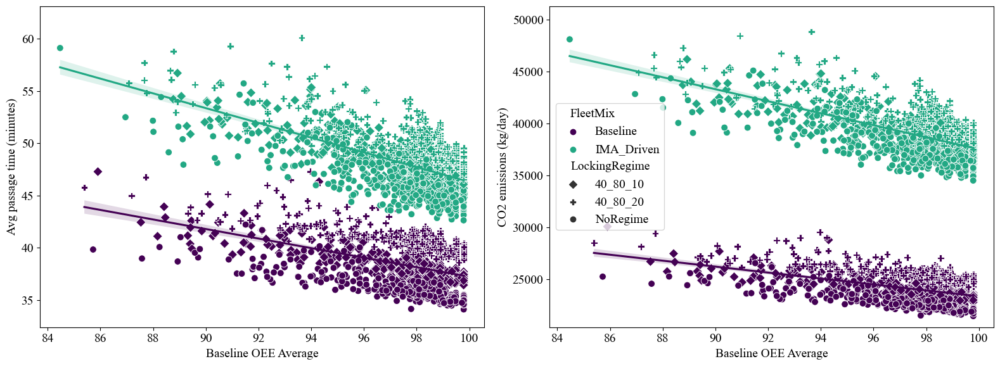

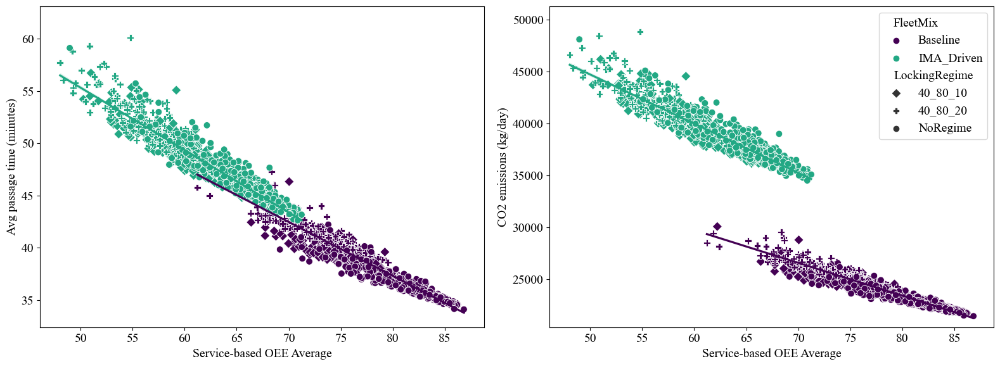

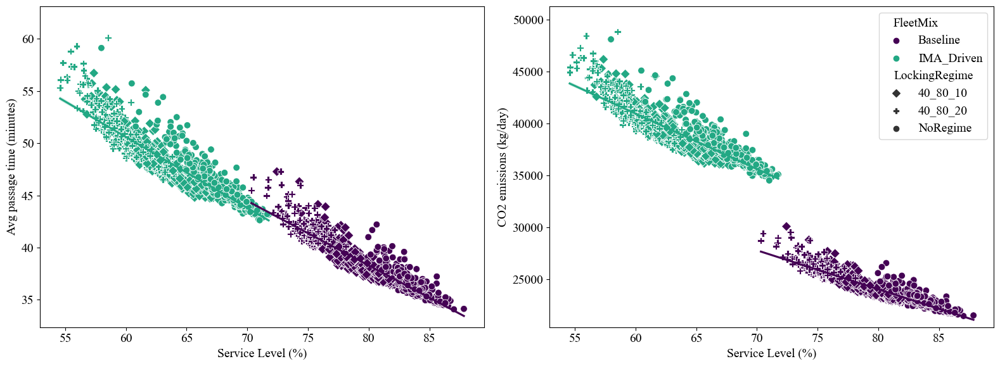

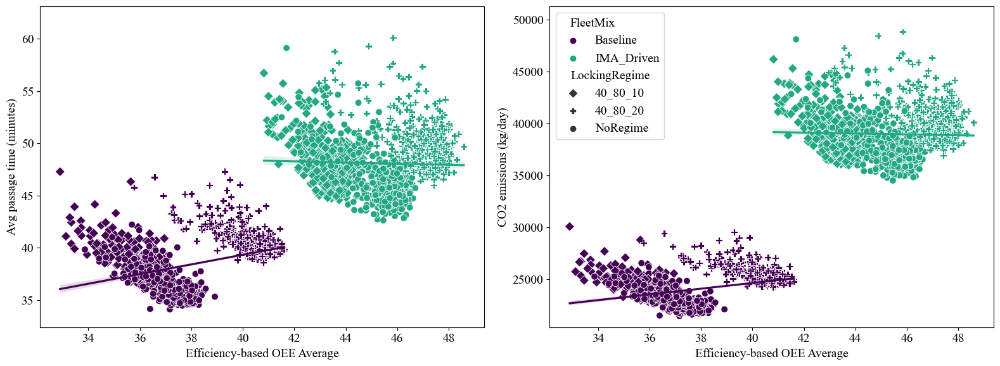

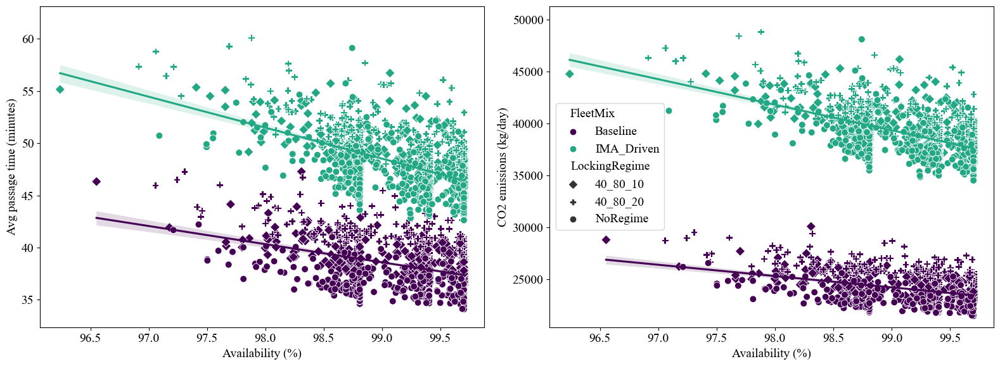

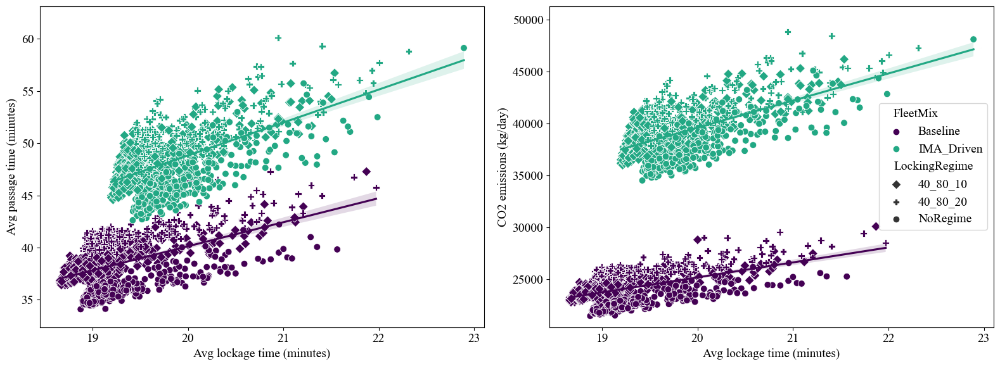

In [42]:
plot_with_regression_2subplots(experiments, 
                            x_axis=['Baseline OEE Average', 'Baseline OEE Average'], color_column='FleetMix', 
                            multi_regression=True, save_plot=True)
plot_with_regression_2subplots(experiments, 
                            x_axis=['Service-based OEE Average', 'Service-based OEE Average'], color_column='FleetMix', 
                            multi_regression=True, save_plot=True)
plot_with_regression_2subplots(experiments, 
                            x_axis=['Service Level (%)', 'Service Level (%)'], color_column='FleetMix', 
                            multi_regression=True, save_plot=True)
plot_with_regression_2subplots(experiments, 
                            x_axis=['Efficiency-based OEE Average', 'Efficiency-based OEE Average'], color_column='FleetMix', 
                            multi_regression=True, save_plot=True)
plot_with_regression_2subplots(experiments, 
                            x_axis=['Availability (%)', 'Availability (%)'], color_column='FleetMix', 
                            multi_regression=True, save_plot=True)
plot_with_regression_2subplots(experiments, 
                            x_axis=['Avg lockage time (minutes)', 'Avg lockage time (minutes)'], color_column='FleetMix', 
                            multi_regression=True, save_plot=True)

In [43]:
cols_OEEs

['Baseline OEE Average',
 'Service-based OEE Average',
 'Efficiency-based OEE Average']

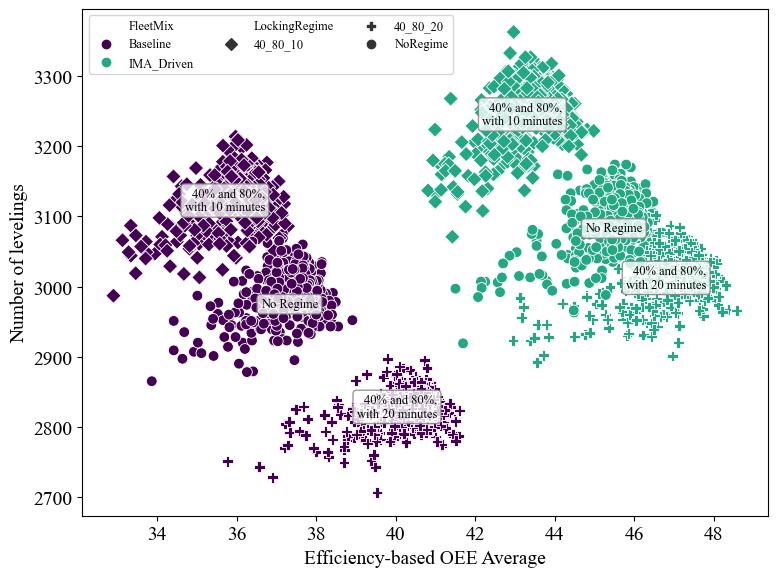

In [44]:
fig, ax = plt.subplots(figsize=(8, 6))
objectives_set = ['Efficiency-based OEE Average', 'Number of levelings']
sns.scatterplot(ax=ax, data=experiments, x='Efficiency-based OEE Average',
                 y='Number of levelings', hue='FleetMix', markers=locking_regime_markers,
                    palette=[viridis_colors[0], viridis_colors[-3]], style='LockingRegime', s=60)
ax.legend(loc='upper left', ncols=3, fontsize=9)

for fleet_mix in experiments['FleetMix'].unique():
    for regime in experiments['LockingRegime'].unique():
         annotate_lock_regime(ax, experiments[experiments['FleetMix']==fleet_mix], regime, objectives_set)

plt.tight_layout()
plt.savefig('output/figs/output_analysis/main_experiment/OEE/efficiency_based_vs_number_levelings.pdf', bbox_inches='tight')
plt.show()

Baseline


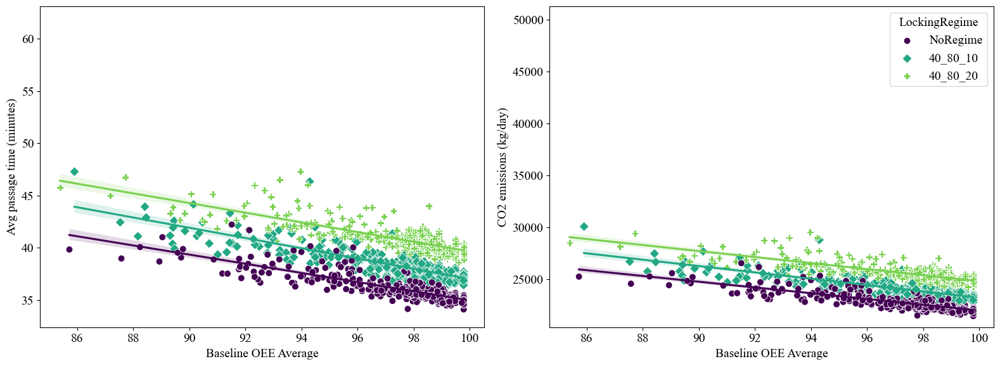

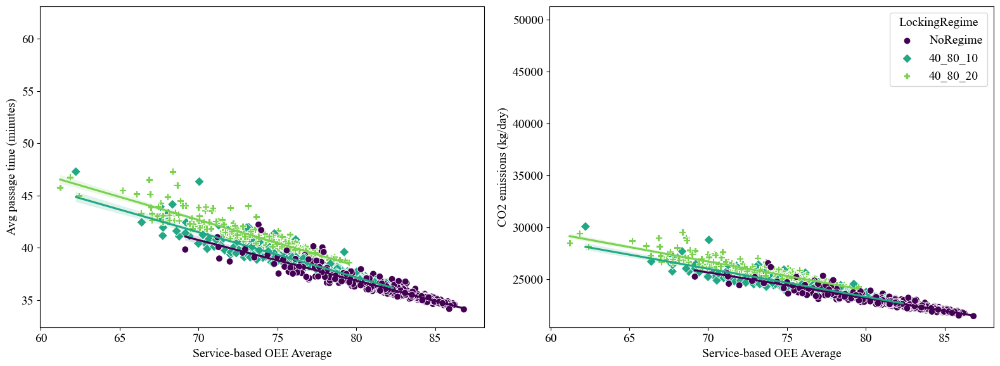

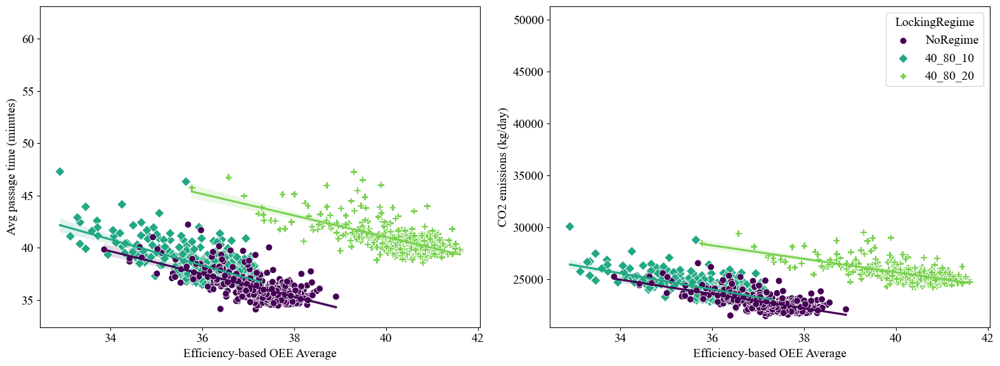

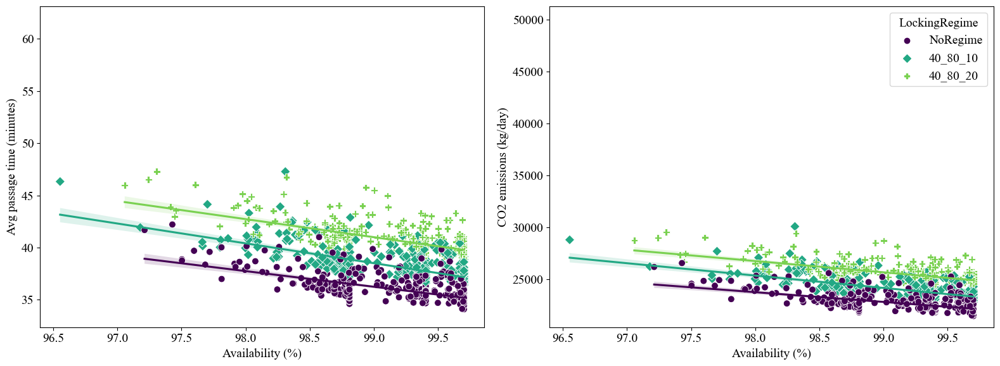

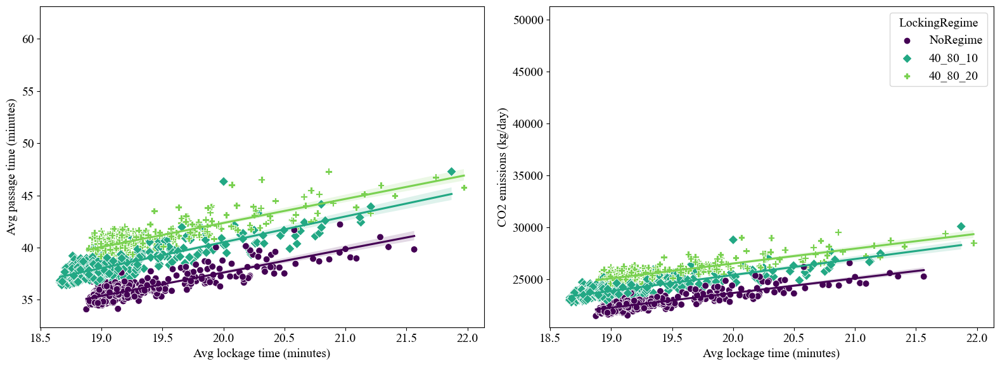

IMA_Driven


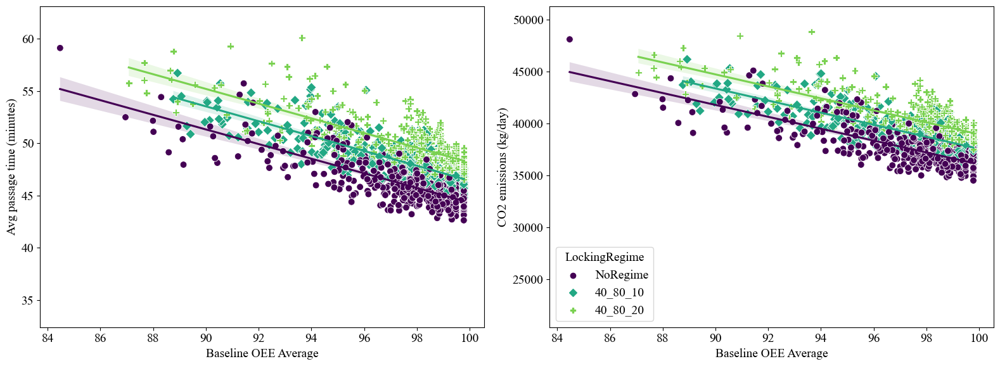

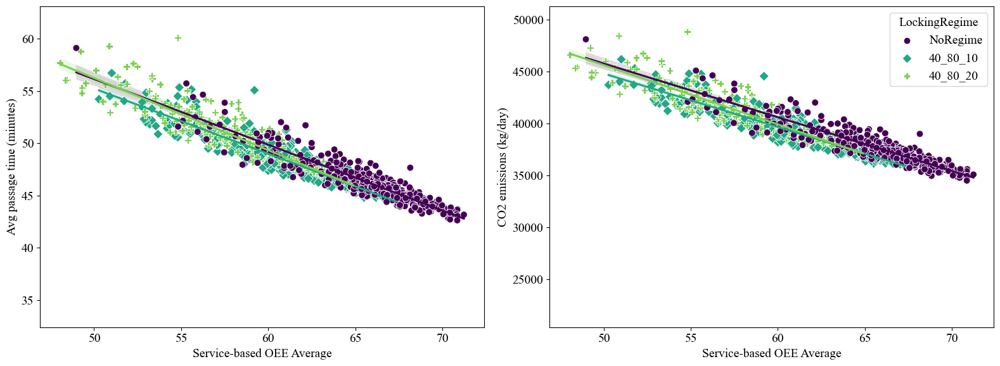

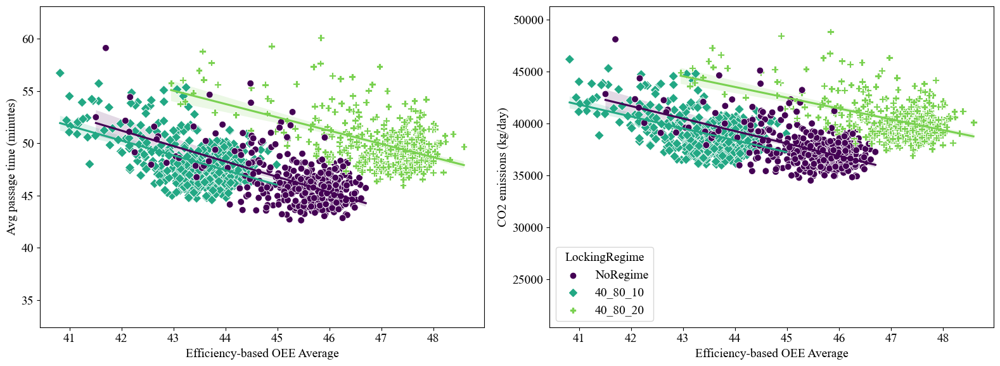

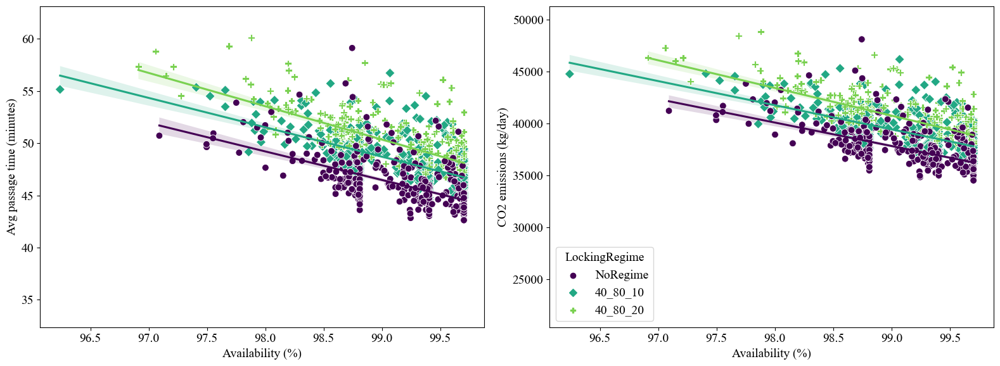

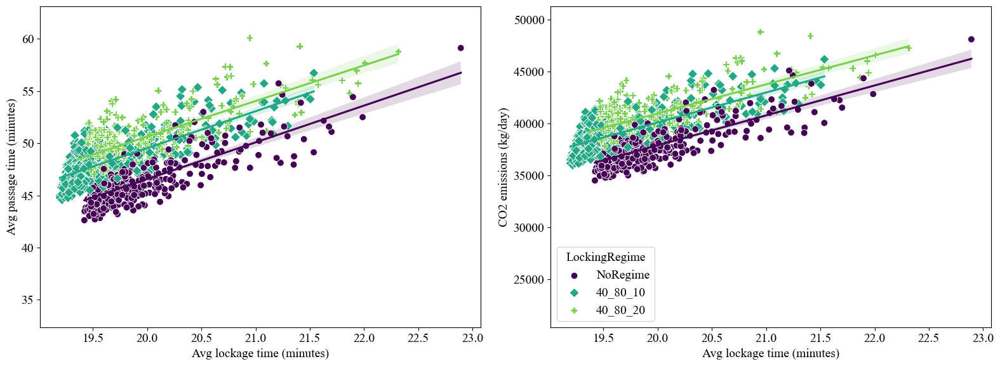

In [45]:
for i, fleet_mix in enumerate(list(experiments.FleetMix.unique())):

    print(fleet_mix)

    plot_with_regression_3subplots(experiments[experiments['FleetMix']==fleet_mix], 
                                x_axis=['Baseline OEE Average', 'Baseline OEE Average'], color_column='LockingRegime', 
                                multi_regression=True, save_plot=True, save_addition=fleet_mix)
    plot_with_regression_3subplots(experiments[experiments['FleetMix']==fleet_mix], 
                                x_axis=['Service-based OEE Average', 'Service-based OEE Average'], color_column='LockingRegime', 
                                multi_regression=True, save_plot=True, save_addition=fleet_mix)
    plot_with_regression_3subplots(experiments[experiments['FleetMix']==fleet_mix], 
                                x_axis=['Efficiency-based OEE Average', 'Efficiency-based OEE Average'], color_column='LockingRegime', 
                                multi_regression=True, save_plot=True, save_addition=fleet_mix)
    plot_with_regression_3subplots(experiments[experiments['FleetMix']==fleet_mix], 
                                x_axis=['Availability (%)', 'Availability (%)'], color_column='LockingRegime', 
                                multi_regression=True, save_plot=True, save_addition=fleet_mix)
    plot_with_regression_3subplots(experiments[experiments['FleetMix']==fleet_mix], 
                                x_axis=['Avg lockage time (minutes)', 'Avg lockage time (minutes)'], color_column='LockingRegime', 
                                multi_regression=True, save_plot=True, save_addition=fleet_mix)

In [46]:
df = experiments[experiments['FleetMix']=='IMA_Driven']
col_x ='Baseline OEE Average'
col_y = 'CO2 emissions (kg/day)'

x= np.array(df[col_x]).reshape(-1, 1)
y= np.array(df[col_y])

model = LinearRegression().fit(x, y)
r_sq = model.score(x, y)
print(f"coefficient of determination: {r_sq}")
print(f"slope: {model.coef_}")
print(f"1-point improvement: {100*model.coef_/df[col_y].mean()}")

coefficient of determination: 0.39964297449539543
slope: [-578.63790092]
1-point improvement: [-1.48435997]


In [47]:
df = pd.DataFrame(0, index=['Baseline', 'IMA_Driven'], columns=['NoRegime', '40_80_10', '40_80_20',])
df.loc['Baseline', 'NoRegime'] = 1
df

,NoRegime,40_80_10,40_80_20
Baseline,1,0,0
IMA_Driven,0,0,0


In [48]:
oee_improvement = {}
oee_coef = {}

for col_y in cols_KPIs + ['Avg passage time (minutes)']:
    oee_improvement[col_y]= {}
    oee_coef[col_y]= {}
    # print('---------------------------', col_y ,'---------------------------')
    for col_x in cols_OEEs + ['Availability (%)', 'Speed (%)', 'Service Level (%)']:
        # print('-----------', col_x ,'-----------')
        oee_improvement[col_y][col_x]= pd.DataFrame(0, index=['Baseline', 'IMA_Driven'], columns=['NoRegime', '40_80_10', '40_80_20'])
        oee_coef[col_y][col_x]= pd.DataFrame(0, index=['Baseline', 'IMA_Driven'], columns=['NoRegime', '40_80_10', '40_80_20'])

        for fleet_mix in ['Baseline', 'IMA_Driven']:
            for regime in ['NoRegime', '40_80_10', '40_80_20']:
                df = experiments[(experiments['FleetMix']==fleet_mix) & (experiments['LockingRegime']==regime)]

                x= np.array(df[col_x]).reshape(-1, 1)
                y= np.array(df[col_y])

                model = LinearRegression().fit(x, y)
                r_sq = model.score(x, y)
                imp = 100*model.coef_/df[col_y].mean()
                # print(f"coefficient of determination: {r_sq}")
                # print(f"slope: {model.coef_}")
                # print(f"1-point improvement: {}")
                oee_improvement[col_y][col_x].loc[fleet_mix, regime] = imp
                oee_coef[col_y][col_x].loc[fleet_mix, regime] = r_sq
        
        oee_improvement[col_y][col_x]['Average'] = oee_improvement[col_y][col_x].mean(axis=1)
        oee_coef[col_y][col_x]['Average'] = oee_coef[col_y][col_x].mean(axis=1)

In [49]:
col_y= 'Avg passage time (minutes)'
print(col_y)
oee_coef[col_y]

Avg passage time (minutes)


{'Baseline OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.697557  0.687314  0.628204  0.671025
 IMA_Driven  0.604702  0.603823  0.546917  0.585148,
 'Service-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.867029  0.873182  0.845472  0.861894
 IMA_Driven  0.870694  0.860176  0.834904  0.855258,
 'Efficiency-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.427830  0.410865  0.422374  0.420356
 IMA_Driven  0.317761  0.244985  0.268669  0.277138,
 'Availability (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.366857  0.431066  0.411326  0.403083
 IMA_Driven  0.352899  0.394765  0.499941  0.415868,
 'Speed (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.554291  0.548930  0.479069  0.527430
 IMA_Driven  0.473765  0.453929  0.390390  0.439361,
 'Service Level (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.758575  0

In [50]:
oee_improvement[col_y]

{'Baseline OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -1.217433 -1.283254 -1.136004 -1.212230
 IMA_Driven -1.519268 -1.473399 -1.409309 -1.467326,
 'Service-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -1.079343 -1.130233 -1.081437 -1.097004
 IMA_Driven -1.365375 -1.292632 -1.382767 -1.346925,
 'Efficiency-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -3.030229 -3.248835 -2.529273 -2.936112
 IMA_Driven -3.208094 -2.933155 -2.554089 -2.898446,
 'Availability (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -4.164637 -4.963164 -4.244664 -4.457489
 IMA_Driven -5.935543 -5.827953 -6.391923 -6.051807,
 'Speed (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -1.127986 -1.204910 -1.035604 -1.122834
 IMA_Driven -1.381186 -1.310317 -1.240631 -1.310711,
 'Service Level (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -2.244642 -2

In [51]:
col_y= cols_KPIs[0]
print(col_y)
oee_coef[col_y]

CO2 emissions (kg/day)


{'Baseline OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.690375  0.674119  0.621648  0.662047
 IMA_Driven  0.592328  0.587197  0.530064  0.569863,
 'Service-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.865538  0.864012  0.846626  0.858725
 IMA_Driven  0.861087  0.849908  0.822937  0.844644,
 'Efficiency-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.422870  0.400868  0.417454  0.413731
 IMA_Driven  0.308398  0.232804  0.255978  0.265727,
 'Availability (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.354846  0.427813  0.406604  0.396421
 IMA_Driven  0.352276  0.391849  0.502115  0.415413,
 'Speed (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.550764  0.537252  0.474125  0.520713
 IMA_Driven  0.462564  0.439678  0.374968  0.425737,
 'Service Level (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.766820  0

In [52]:
oee_improvement[col_y]

{'Baseline OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -1.225457 -1.277428 -1.139242 -1.214042
 IMA_Driven -1.529664 -1.491123 -1.430980 -1.483922,
 'Service-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -1.091154 -1.130078 -1.090967 -1.104066
 IMA_Driven -1.381319 -1.318630 -1.415918 -1.371956,
 'Efficiency-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -3.048201 -3.225611 -2.534925 -2.936246
 IMA_Driven -3.215173 -2.934379 -2.571301 -2.906951,
 'Availability (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -4.144281 -4.969889 -4.254519 -4.456230
 IMA_Driven -6.032923 -5.958843 -6.606903 -6.199556,
 'Speed (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -1.137674 -1.198169 -1.038617 -1.124820
 IMA_Driven -1.388380 -1.323443 -1.254048 -1.321957,
 'Service Level (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -2.283470 -2

In [53]:
col_y= cols_KPIs[2]
print(col_y)
oee_coef[col_y]

Avg waiting time (minutes)


{'Baseline OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.440428  0.453051  0.372210  0.421896
 IMA_Driven  0.447413  0.445837  0.382584  0.425278,
 'Service-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.692740  0.723870  0.683664  0.700091
 IMA_Driven  0.774355  0.766651  0.733372  0.758126,
 'Efficiency-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.211135  0.210688  0.204571  0.208798
 IMA_Driven  0.192526  0.133231  0.143606  0.156454,
 'Availability (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.500822  0.541642  0.519573  0.520679
 IMA_Driven  0.419140  0.477675  0.562938  0.486584,
 'Speed (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.294276  0.311892  0.232468  0.279545
 IMA_Driven  0.319270  0.299892  0.238281  0.285814,
 'Service Level (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline    0.814374  0

In [54]:
oee_improvement[col_y]

{'Baseline OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -1.440407 -1.520784 -1.195914 -1.385701
 IMA_Driven -1.912214 -1.792264 -1.653041 -1.785840,
 'Service-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -1.436548 -1.502120 -1.329993 -1.422887
 IMA_Driven -1.884116 -1.727541 -1.817473 -1.809710,
 'Efficiency-based OEE Average':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -3.169655 -3.395919 -2.407385 -2.990986
 IMA_Driven -3.653924 -3.062076 -2.618718 -3.111573,
 'Availability (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -7.245412 -8.120853 -6.524546 -7.296937
 IMA_Driven -9.465265 -9.075303 -9.512121 -9.350897,
 'Speed (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -1.223785 -1.325736 -0.986626 -1.178716
 IMA_Driven -1.659083 -1.507693 -1.359293 -1.508690,
 'Service Level (%)':             NoRegime  40_80_10  40_80_20   Average
 Baseline   -3.463000 -3

In [59]:
kpi = 'Baseline OEE Average'
for fleet_mix in experiments['FleetMix'].unique():
    print('-------------------------------', fleet_mix ,'-------------------------------')
    for lock_condition in experiments['LockCondition'].unique():
        print('------------', lock_condition, '------------')
        df = experiments[(experiments['LockCondition']==lock_condition)]

        for i in range(3):
            for j in range(i+1,3):
                x = df[(df['MTTR']==df['MTTR'].unique()[i])][kpi]
                y = df[(df['MTTR']==df['MTTR'].unique()[j])][kpi]
                same_dist_hypothesis(x, y, x_Name=experiments['MTTR'].unique()[i], y_Name=experiments['MTTR'].unique()[j], 
                                    to_be_printed='reject')

------------------------------- Baseline -------------------------------
------------ (1) Ideal ------------
------------ (2) Fluttering only ------------
Reject the hypothesis that 0.5 and 3.5 follow the same distribution ( 0.018566878576656717 & 0.06464507084414094 )
------------ (3) Slowdown only ------------
------------ (4) Regular deterioration ------------
Reject the hypothesis that 0.5 and 2.0 follow the same distribution ( 0.00463487620725906 & 0.7571721604876407 )
Reject the hypothesis that 0.5 and 3.5 follow the same distribution ( 0.002162002040669629 & 0.21657241672594024 )
------------ (5) Rapid deterioration ------------
Reject the hypothesis that 0.5 and 2.0 follow the same distribution ( 0.0031837701228267005 & 0.3940506633962564 )
Reject the hypothesis that 0.5 and 3.5 follow the same distribution ( 0.00010413360469600742 & 0.30140766416543796 )
------------------------------- IMA_Driven -------------------------------
------------ (1) Ideal ------------
------------ 

In [60]:
kpi = 'Baseline OEE Average'
for fleet_mix in experiments['FleetMix'].unique():
    print('-------------------------------', fleet_mix ,'-------------------------------')
    for lock_condition in experiments['LockCondition'].unique():
        print('------------', lock_condition, '------------')
        df = experiments[(experiments['LockCondition']==lock_condition)]

        for i in range(3):
            for j in range(i+1,3):
                x = df[(df['PeriodicInspection']==df['PeriodicInspection'].unique()[i])][kpi]
                y = df[(df['PeriodicInspection']==df['PeriodicInspection'].unique()[j])][kpi]
                same_dist_hypothesis(x, y, x_Name=experiments['PeriodicInspection'].unique()[i], y_Name=experiments['PeriodicInspection'].unique()[j], 
                                    to_be_printed='reject')

------------------------------- Baseline -------------------------------
------------ (1) Ideal ------------
Reject the hypothesis that 7 and 14 follow the same distribution ( 2.0264894098983607e-107 & 0.6659205308883742 )
Reject the hypothesis that 7 and 28 follow the same distribution ( 2.0264894098983607e-107 & 0.8051959274189497 )
Reject the hypothesis that 14 and 28 follow the same distribution ( 2.0264894098983607e-107 & 0.8517215427791759 )
------------ (2) Fluttering only ------------
Reject the hypothesis that 7 and 14 follow the same distribution ( 4.458523169645524e-84 & 0.6472644442744389 )
Reject the hypothesis that 7 and 28 follow the same distribution ( 1.5626908316337427e-100 & 0.8037661887884244 )
Reject the hypothesis that 14 and 28 follow the same distribution ( 1.0500537376418953e-58 & 0.8541700823438209 )
------------ (3) Slowdown only ------------
Reject the hypothesis that 7 and 14 follow the same distribution ( 2.8245780379552226e-06 & 8.072678115259541e-10 )
Re

In [61]:
pd.pivot_table(experiments, values='Baseline OEE Average', index='MTTR', columns=['LockCondition', 'FleetMix'])

LockCondition  (1) Ideal            (2) Fluttering only             \
FleetMix        Baseline IMA_Driven            Baseline IMA_Driven   
MTTR                                                                 
0.5            99.389650  99.385113           98.861886  98.845542   
2.0            99.389663  99.385028           98.765383  98.729817   
3.5            99.389730  99.385048           98.714860  98.707500   

LockCondition (3) Slowdown only            (4) Regular deterioration  \
FleetMix               Baseline IMA_Driven                  Baseline   
MTTR                                                                   
0.5                   98.297571  97.941328                 97.827011   
2.0                   98.282008  98.148335                 97.497283   
3.5                   98.128614  98.090456                 97.342609   

LockCondition            (5) Rapid deterioration             
FleetMix      IMA_Driven                Baseline IMA_Driven  
MTTR                                                         
0.5            97.345179               94.582766  94.081013  
2.0            97.563608               93.665595  93.618324  
3.5            97.506625               92.964988  93.399181

In [62]:
pd.pivot_table(experiments, values='Baseline OEE Average', index='PeriodicInspection', columns='LockCondition')

LockCondition,(1) Ideal,(2) Fluttering only,(3) Slowdown only,(4) Regular deterioration,(5) Rapid deterioration
PeriodicInspection,,,,,
7,98.891258,98.274515,98.278346,97.734290,95.292739
14,99.486672,98.866424,98.444162,97.747998,94.124962
28,99.784186,99.171556,97.721648,97.058870,91.738233
